In [15]:
# General
import numpy as np
import pandas as pd
import os, sys

# For data prep and pre-processing
from jumpmodels.utils import filter_date_range 
from jumpmodels.preprocess import StandardScalerPD, DataClipperStd
from sklearn.preprocessing import StandardScaler

# For model fit and prediction
from joblib import Parallel, delayed # allows parallel grid search on all 4 cores
from jumpmodels.sparse_jump import SparseJumpModel

# For plotting
from jumpmodels.plot import plot_regimes_and_cumret, plot_cumret
import matplotlib.pyplot as plt
import matplotlib as mpl    
mpl.rcParams["text.usetex"] = False


# Portfolio allocation
from pypfopt.black_litterman import BlackLittermanModel
from pypfopt.efficient_frontier import EfficientFrontier

sys.path.append('/Users/victor/Documents/thesis_vri_vp/vic_new')         # for mac
#sys.path.append('C:\\Users\\victo\\git_new\\thesis_vri_vp\\vic_new')      # for windows
from feature_set_v2 import MergedDataLoader 




In [16]:
def get_train_val_windows(
        current_date, 
        full_data, 
        min_train_years=8,
        max_train_years=12, 
        val_years=3,
        initial_train_start=None
    ):
        # 1) Validation window
        val_end = current_date
        val_start = val_end - pd.DateOffset(years=val_years)
        
        # 2) Training window ends just before validation
        train_end = val_start - pd.DateOffset(days=1)
        
        # 3) By default, try the *largest* training window (max_train_years)
        train_start_candidate = train_end - pd.DateOffset(years=max_train_years)
        
        # 4) Don’t go before your global earliest start
        if initial_train_start is not None:
            earliest_start_dt = pd.to_datetime(initial_train_start)
            train_start_candidate = max(train_start_candidate, earliest_start_dt)
        
        # 5) Ensure we have at least min_train_years from train_start to train_end
        if (train_end - train_start_candidate) < pd.Timedelta(days=365.25 * min_train_years):
            # Move train_start_candidate to enforce minimum
            train_start_candidate = train_end - pd.DateOffset(years=min_train_years)
            # Also don’t go before earliest global date
            if initial_train_start is not None:
                train_start_candidate = max(train_start_candidate, earliest_start_dt)
        
        # Filter actual data
        idx = full_data.index
        train_dates = idx[(idx >= train_start_candidate) & (idx <= train_end)]
        val_dates   = idx[(idx >= val_start) & (idx <= val_end)]
        
        if len(train_dates) == 0 or len(val_dates) == 0:
            raise ValueError(
                f"No data found for train [{train_start_candidate} to {train_end}]"
                f" or val [{val_start} to {val_end}]"
            )
        
        return train_dates[0], train_dates[-1], val_dates[0], val_dates[-1]


def rolling_time_series_cv_sjm_long_short_optimized(
    lambda_values,
    kappa_values,
    X_train,
    X_val,
    factor_returns_train,
    factor_returns_val,
    market_returns_train,
    market_returns_val,
    cost_per_100pct=0.0005,
    annual_threshold=0.05
):
    """
    Optimized CV function that evaluates hyperparameters on pre-defined train/val sets.
    Returns the best hyperparameters and associated model.
    """
    # Ensure DataFrames have aligned indices
    train_common_index = X_train.index.intersection(factor_returns_train.index).intersection(market_returns_train.index)
    val_common_index = X_val.index.intersection(factor_returns_val.index).intersection(market_returns_val.index)
    
    if len(train_common_index) == 0 or len(val_common_index) == 0:
        raise ValueError("No common dates between X, factor_returns, and market_returns")
    
    # Apply common index
    X_train = X_train.loc[train_common_index]
    factor_returns_train = factor_returns_train.loc[train_common_index]
    market_returns_train = market_returns_train.loc[train_common_index]
    
    X_val = X_val.loc[val_common_index]
    factor_returns_val = factor_returns_val.loc[val_common_index]
    market_returns_val = market_returns_val.loc[val_common_index]
    
    # Generate active returns
    active_train = factor_returns_train - market_returns_train
    active_val = factor_returns_val - market_returns_val
    
    train_years = (X_train.index[-1] - X_train.index[0]).days / 365.25
    val_years   = (X_val.index[-1]   - X_val.index[0]).days / 365.25

    print(f"Training data:   {X_train.index[0].date()} → {X_train.index[-1].date()}, "
        f"{len(X_train)} days  ({train_years:.1f} years)")

    print(f"Validation data: {X_val.index[0].date()} → {X_val.index[-1].date()}, "
        f"{len(X_val)} days  ({val_years:.1f} years)")

    
    # Standardize and clip the data
    clipper = DataClipperStd(mul=3.)
    X_train_clipped = clipper.fit_transform(X_train)
    X_val_clipped = clipper.transform(X_val)
    
    scaler = StandardScaler()
    X_train_scaled = pd.DataFrame(
        scaler.fit_transform(X_train_clipped),
        index=X_train_clipped.index,
        columns=X_train_clipped.columns
    )
    X_val_scaled = pd.DataFrame(
        scaler.transform(X_val_clipped),
        index=X_val_clipped.index,
        columns=X_val_clipped.columns
    )
    
    # Grid search over hyperparameters
    best_sharpe = -np.inf
    best_lambda = None
    best_kappa = None
    best_model = None
    results = []
    
    for lam in lambda_values:
        for kappa in kappa_values:
            max_feats = int(kappa**2)
            
            try:
                # Fit model
                model = SparseJumpModel(
                    n_components=2,
                    max_feats=max_feats,
                    jump_penalty=lam,
                    cont=False,
                    max_iter=30
                )
                model.fit(X_train_scaled, ret_ser=active_train, sort_by="cumret")
                
                # Calculate regime counts for diagnostic purposes
                train_states = model.predict(X_train_scaled)
                regime_counts = np.bincount(train_states, minlength=2)
                
                # Skip if model didn't find both regimes or has NaN returns
                if regime_counts[0] == 0 or regime_counts[1] == 0 or np.isnan(model.ret_).any():
                    print(f"Skipping λ={lam:.2f}, κ={kappa:.2f}: Invalid regime distribution {regime_counts} or NaN returns")
                    results.append(-np.inf)
                    continue
                
                # Calculate positions and returns on validation set
                val_states = model.predict_online(X_val_scaled)
                val_regime_counts = np.bincount(val_states, minlength=2)
                
                # Define position function
                def position_from_expected_return(ann_ret, threshold=annual_threshold):
                    if ann_ret > threshold: 
                        return 1.0
                    elif ann_ret < -threshold: 
                        return -1.0
                    else: 
                        return ann_ret / threshold

                # Map regime returns to expected annual returns
                state_avg_daily_active_ret = model.ret_
                state_to_expected = {
                    st: state_avg_daily_active_ret[st] * 252 for st in range(len(state_avg_daily_active_ret))
                }
                
                # Calculate strategy returns with day-lag logic
                strategy_ret = np.zeros(len(val_states))
                prev_position = 0.0
                
                for t in range(len(val_states)):
                    st = val_states.iloc[t]
                    # Calculate PnL based on previous day's position
                    daily_pnl = prev_position * active_val.iloc[t]
                    
                    # Calculate new position based on current day's state
                    new_position = position_from_expected_return(state_to_expected.get(st, 0.0))
                    
                    # Calculate trading costs
                    turnover = abs(new_position - prev_position)
                    cost = turnover * cost_per_100pct
                    
                    # Record strategy return
                    strategy_ret[t] = daily_pnl - cost
                    
                    # Update position for next day
                    prev_position = new_position
                
                # Calculate Sharpe ratio
                avg_ret = np.mean(strategy_ret)
                std_ret = np.std(strategy_ret, ddof=1)
                
                # Skip if std is zero
                if std_ret == 0:
                    print(f"Skipping λ={lam:.2f}, κ={kappa:.2f}: Invalid regime distribution {regime_counts} or NaN returns")
                    results.append(-np.inf)
                    continue
                    
                val_sharpe = (avg_ret/std_ret) * np.sqrt(252)
                results.append(val_sharpe)
                
                # # Print diagnostics that show lambda, sharpe, and regimes for the current fold
                # print(f"λ={lam:.2f}, κ={kappa:.2f}, Sharpe={val_sharpe:.4f}, "
                #       f"Train states={regime_counts}, Val states={val_regime_counts}")
                
                # Update best if improved
                if val_sharpe > best_sharpe:
                    best_sharpe = val_sharpe
                    best_lambda = lam
                    best_kappa = kappa
                    best_model = model
                    
            except Exception as e:
                print(f"Error with λ={lam}, κ={kappa}: {e}")
                results.append(-np.inf)
    
    if best_model is None:
        raise ValueError("No valid model found during hyperparameter search")
        
    print(f"Best params: λ={best_lambda:.2f}, κ={best_kappa:.2f}, Sharpe={best_sharpe:.4f}")
    
    # Reshape results for plotting
    results_array = np.array(results).reshape(len(lambda_values), len(kappa_values))
    
    return {
        "best_lambda": best_lambda,
        "best_kappa": best_kappa,
        "best_sharpe": best_sharpe,
        "best_model": best_model,
        "results_array": results_array
    }

In [17]:
# -----------------------  CROSS‑VALIDATION MODULE  ----------------------- #

# ------------------------------------------------------------------------ #

def run_cv(factors, factor_data_dict, cv_dates,
           lambda_grid, kappa_grid,
           *, min_train_years=8, max_train_years=12,
           val_years=3, initial_train_start=None,
           save_path="cv_params_grid_75-150.parquet",
           make_plots=True):

    records           = []
    evolution_plotbuf = []        # hold λ & κ per factor per date for later plot

    for cv_end in cv_dates:
        for fac in factors:
            X       = factor_data_dict[fac]["X"]
            fac_ret = factor_data_dict[fac]["fac_ret"]
            mkt_ret = factor_data_dict[fac]["mkt_ret"]

            train_start, train_end, val_start, val_end = get_train_val_windows(
                cv_end, X,
                min_train_years=min_train_years,
                max_train_years=max_train_years,
                val_years=val_years,
                initial_train_start=initial_train_start)

            X_train  = filter_date_range(X,       train_start, train_end)
            X_val    = filter_date_range(X,       val_start,   val_end)
            fr_train = filter_date_range(fac_ret, train_start, train_end)
            fr_val   = filter_date_range(fac_ret, val_start,   val_end)
            mr_train = filter_date_range(mkt_ret, train_start, train_end)
            mr_val   = filter_date_range(mkt_ret, val_start,   val_end)

            res = rolling_time_series_cv_sjm_long_short_optimized(
                    lambda_values=lambda_grid,
                    kappa_values=kappa_grid,
                    X_train=X_train,
                    X_val=X_val,
                    factor_returns_train=fr_train,
                    factor_returns_val=fr_val,
                    market_returns_train=mr_train,
                    market_returns_val=mr_val)

            # ----------- store best params ------------------------------------
            records.append({
                "date": cv_end, "factor": fac,
                "best_lambda": res["best_lambda"],
                "best_kappa":  res["best_kappa"]
            })
            evolution_plotbuf.append({
                "date": cv_end, "factor": fac,
                "lambda": res["best_lambda"],
                "kappa":  res["best_kappa"]
            })
            # ----------- per‑CV plot -----------------------------------------
            if make_plots:
                plt.figure(figsize=(8, 5))
                for k_i, k in enumerate(kappa_grid):
                    plt.plot(lambda_grid,
                             res["results_array"][:, k_i],
                             label=f"κ={k:.1f}")
                plt.axvline(res["best_lambda"], ls="--", c="r", alpha=.6)
                plt.xscale("log"); plt.grid(True, ls=":")
                plt.title(f"{fac} | CV cut-off {cv_end.date()}")
                plt.xlabel('$\\lambda$ (log scale)')
                plt.ylabel("Validation Sharpe")
                plt.legend()
                plt.tight_layout(); plt.show()

                # optional heat‑map
                # fig, ax = plt.subplots(figsize=(6,4))
                # hm = ax.imshow(res["results_array"], origin="lower",
                #                aspect="auto",
                #                extent=[lambda_grid[0], lambda_grid[-1],
                #                        kappa_grid[0],  kappa_grid[-1]])
                # ax.set_xscale("log"); plt.colorbar(hm, ax=ax)
                # ax.set_xlabel(r'$\lambda$');   ax.set_ylabel(r'$\kappa$')
                # ax.set_title(f"Sharpe surface | {fac} @ {cv_end.date()}")
                # plt.tight_layout(); plt.show()

    cv_df = pd.DataFrame(records).sort_values(["factor", "date"])
    if save_path:
        cv_df.to_parquet(save_path)

    # -------- overall evolution plot (λ & κ through time) -------------
    if make_plots:
        evo = pd.DataFrame(evolution_plotbuf)
        for fac in factors:
            sub = evo[evo["factor"] == fac].sort_values("date")
            fig, ax1 = plt.subplots(figsize=(9, 5))
            ax1.plot(sub["date"], sub["lambda"], marker="o", label='$\\lambda$', lw=1.8)
            ax1.set_ylabel('$\\lambda$', color="tab:blue"); ax1.tick_params(axis='y', labelcolor='tab:blue')
            ax2 = ax1.twinx()
            ax2.plot(sub["date"], sub["kappa"], marker="x", ls="--", color="tab:red", label='$\\kappa$', lw=1.8)
            ax2.set_ylabel('$\\kappa$', color="tab:red"); ax2.tick_params(axis='y', labelcolor='tab:red')
            ax1.set_title(f"{fac}  -  hyper-parameter evolution")
            ax1.set_xlabel("CV end-date"); ax1.grid(True, ls=":")
            ax1.legend(loc="upper left"); ax2.legend(loc="upper right")
            plt.tight_layout(); plt.show()

    return cv_df

Training data:   2002-08-29 → 2011-01-28, 2044 days  (8.4 years)
Validation data: 2011-01-31 → 2014-01-31, 735 days  (3.0 years)
Best params: λ=108.62, κ=2.00, Sharpe=0.1779


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


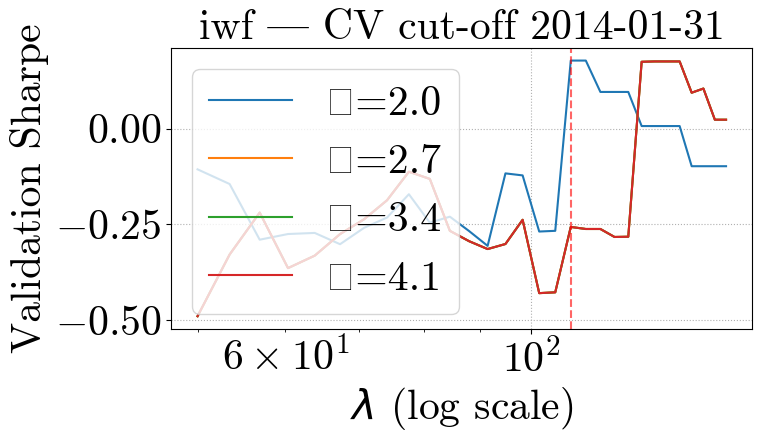

Training data:   2002-08-29 → 2011-01-28, 2044 days  (8.4 years)
Validation data: 2011-01-31 → 2014-01-31, 735 days  (3.0 years)
Best params: λ=63.79, κ=2.00, Sharpe=1.3967


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


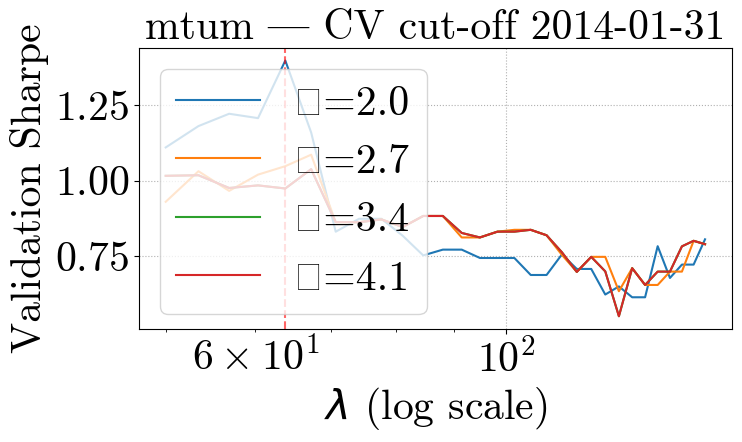

Training data:   2002-08-29 → 2011-01-28, 2044 days  (8.4 years)
Validation data: 2011-01-31 → 2014-01-31, 735 days  (3.0 years)
Best params: λ=132.76, κ=2.71, Sharpe=-0.1799


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


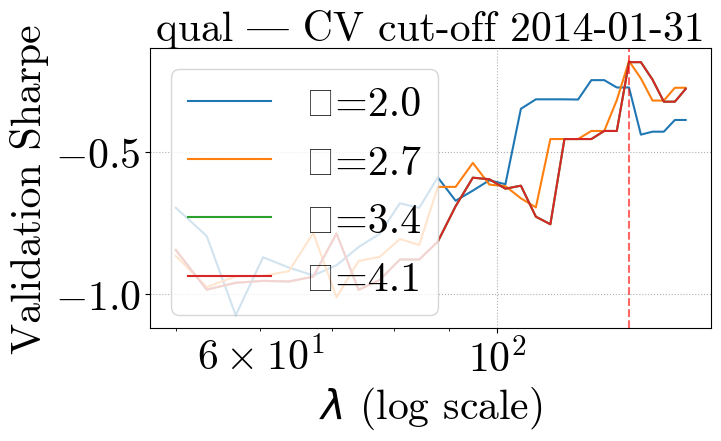

Training data:   2002-08-29 → 2011-01-28, 2044 days  (8.4 years)
Validation data: 2011-01-31 → 2014-01-31, 735 days  (3.0 years)
Best params: λ=53.45, κ=3.42, Sharpe=0.1552


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


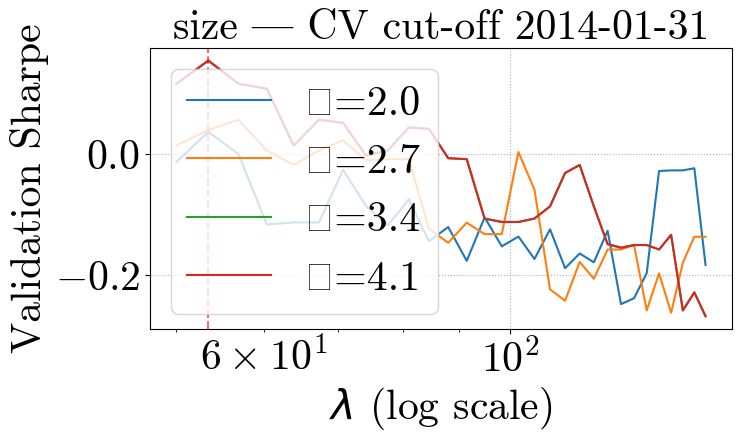

Training data:   2002-08-29 → 2011-01-28, 2044 days  (8.4 years)
Validation data: 2011-01-31 → 2014-01-31, 735 days  (3.0 years)
Best params: λ=143.10, κ=2.71, Sharpe=0.0396


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


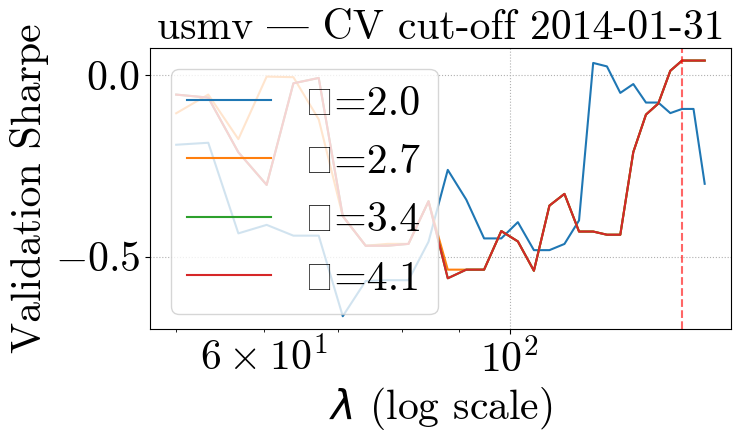

Training data:   2002-08-29 → 2011-01-28, 2044 days  (8.4 years)
Validation data: 2011-01-31 → 2014-01-31, 735 days  (3.0 years)
Best params: λ=98.28, κ=2.00, Sharpe=1.1728


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


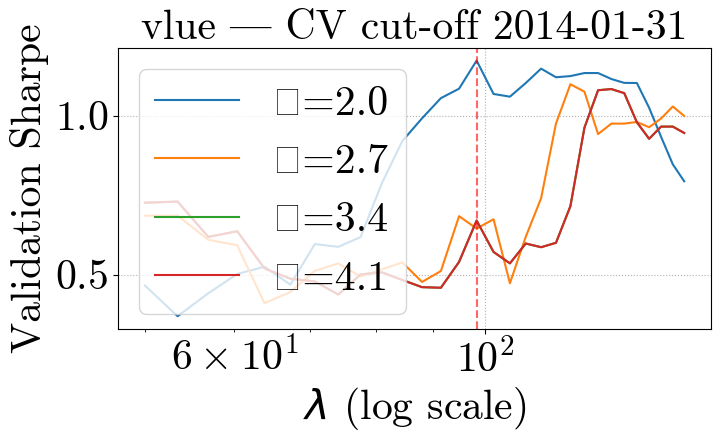

Training data:   2002-08-29 → 2011-07-29, 2166 days  (8.9 years)
Validation data: 2011-08-01 → 2014-07-31, 738 days  (3.0 years)
Best params: λ=129.31, κ=2.71, Sharpe=0.1290


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


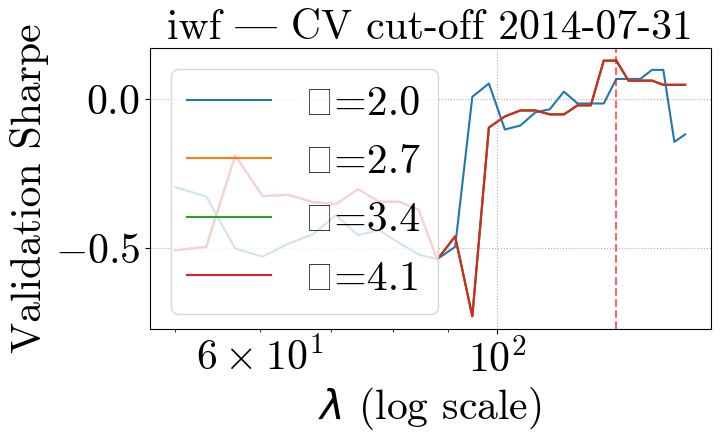

Training data:   2002-08-29 → 2011-07-29, 2166 days  (8.9 years)
Validation data: 2011-08-01 → 2014-07-31, 738 days  (3.0 years)
Best params: λ=63.79, κ=2.00, Sharpe=0.6514


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


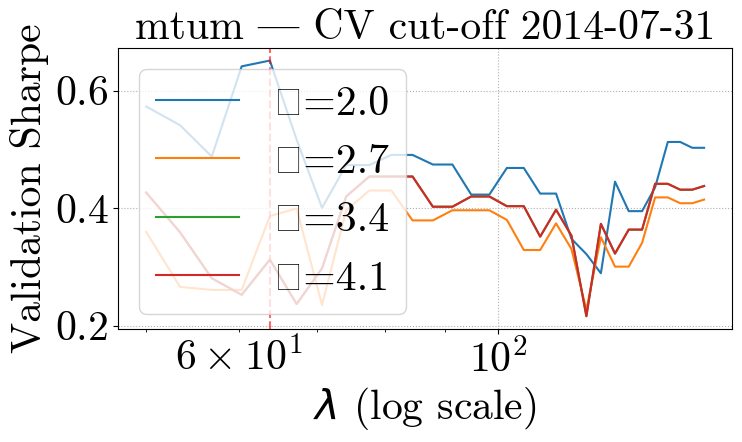

Training data:   2002-08-29 → 2011-07-29, 2166 days  (8.9 years)
Validation data: 2011-08-01 → 2014-07-31, 738 days  (3.0 years)
Best params: λ=132.76, κ=2.71, Sharpe=0.3489


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


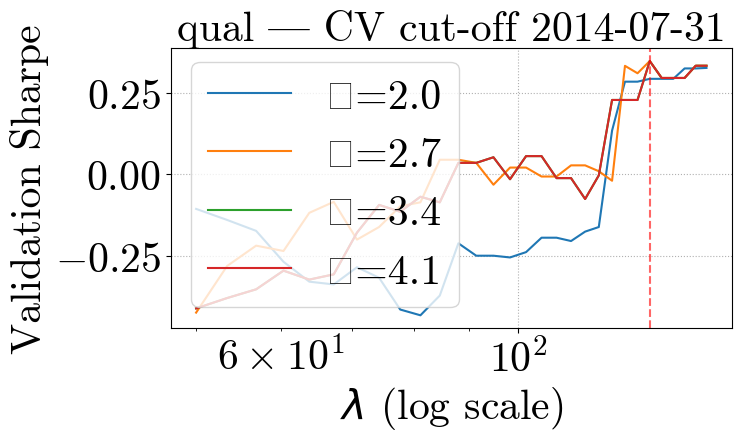

Training data:   2002-08-29 → 2011-07-29, 2166 days  (8.9 years)
Validation data: 2011-08-01 → 2014-07-31, 738 days  (3.0 years)
Best params: λ=50.00, κ=3.42, Sharpe=0.1352


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


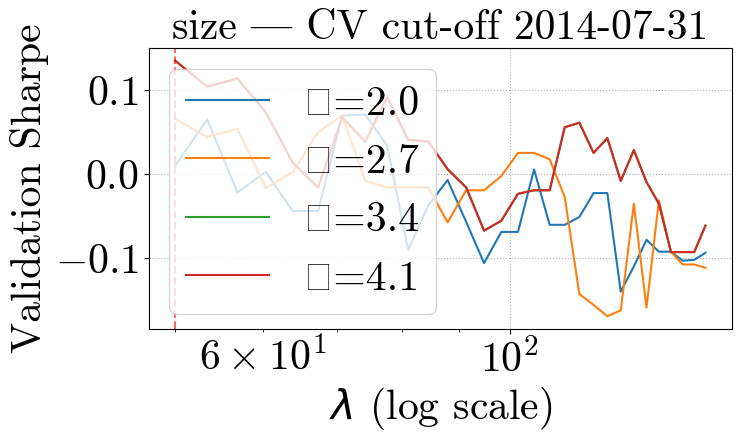

Training data:   2002-08-29 → 2011-07-29, 2166 days  (8.9 years)
Validation data: 2011-08-01 → 2014-07-31, 738 days  (3.0 years)
Best params: λ=125.86, κ=2.00, Sharpe=0.6413


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


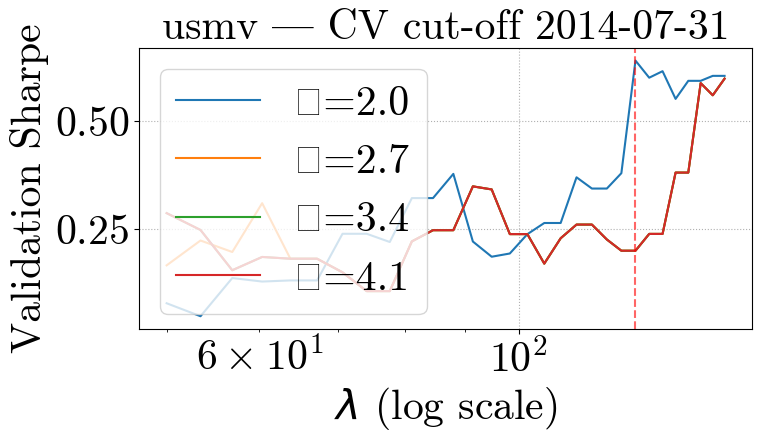

Training data:   2002-08-29 → 2011-07-29, 2166 days  (8.9 years)
Validation data: 2011-08-01 → 2014-07-31, 738 days  (3.0 years)
Best params: λ=118.97, κ=2.00, Sharpe=1.3711


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


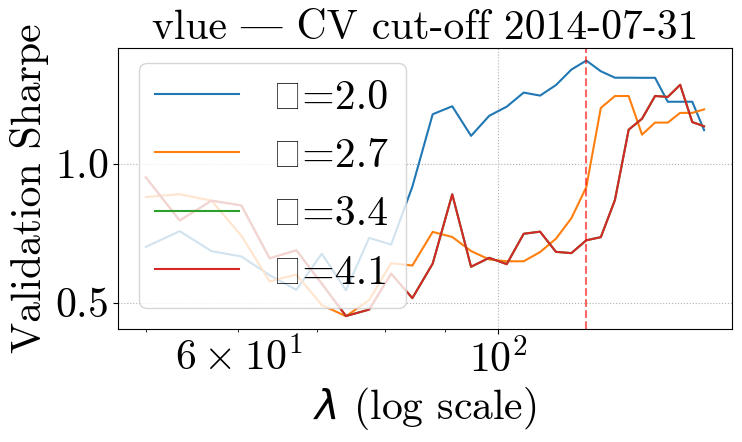

Training data:   2002-08-29 → 2012-01-27, 2286 days  (9.4 years)
Validation data: 2012-01-30 → 2015-01-30, 744 days  (3.0 years)
Best params: λ=122.41, κ=2.00, Sharpe=0.2301


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


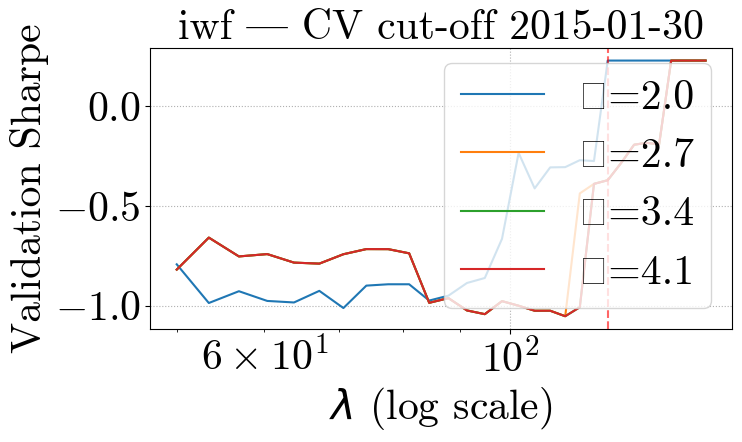

Training data:   2002-08-29 → 2012-01-27, 2286 days  (9.4 years)
Validation data: 2012-01-30 → 2015-01-30, 744 days  (3.0 years)
Best params: λ=84.48, κ=2.00, Sharpe=1.3654


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


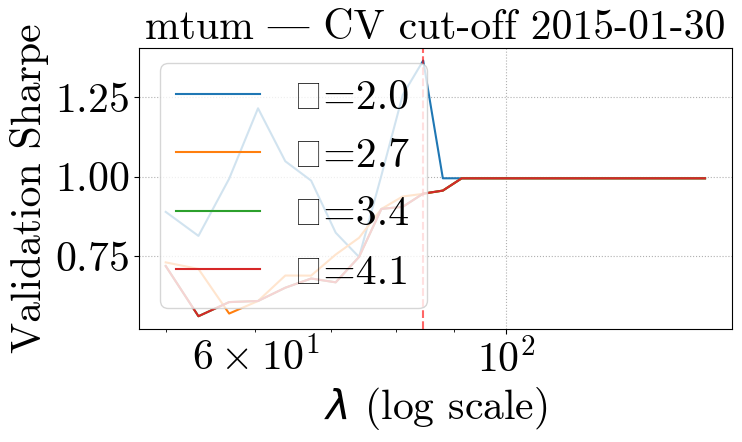

Training data:   2002-08-29 → 2012-01-27, 2286 days  (9.4 years)
Validation data: 2012-01-30 → 2015-01-30, 744 days  (3.0 years)
Best params: λ=108.62, κ=2.00, Sharpe=-0.2620


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


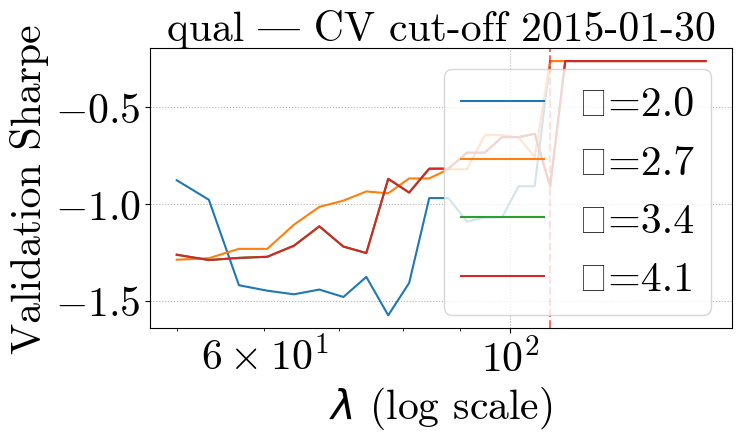

Training data:   2002-08-29 → 2012-01-27, 2286 days  (9.4 years)
Validation data: 2012-01-30 → 2015-01-30, 744 days  (3.0 years)
Best params: λ=56.90, κ=2.71, Sharpe=0.0038


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


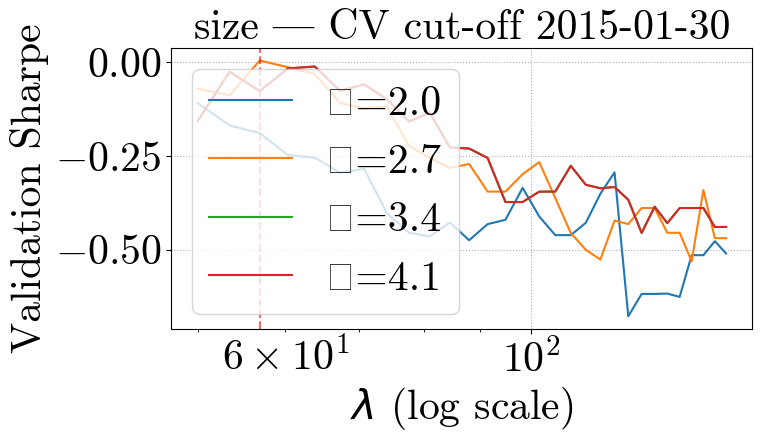

Training data:   2002-08-29 → 2012-01-27, 2286 days  (9.4 years)
Validation data: 2012-01-30 → 2015-01-30, 744 days  (3.0 years)
Best params: λ=150.00, κ=2.00, Sharpe=-0.1513


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


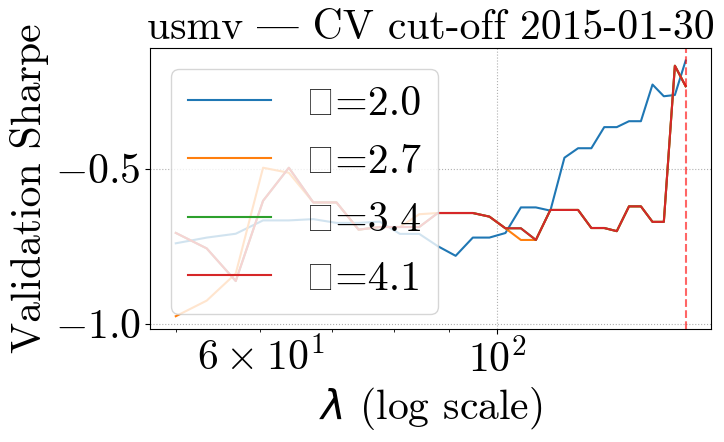

Training data:   2002-08-29 → 2012-01-27, 2286 days  (9.4 years)
Validation data: 2012-01-30 → 2015-01-30, 744 days  (3.0 years)
Best params: λ=139.66, κ=2.00, Sharpe=1.2038


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


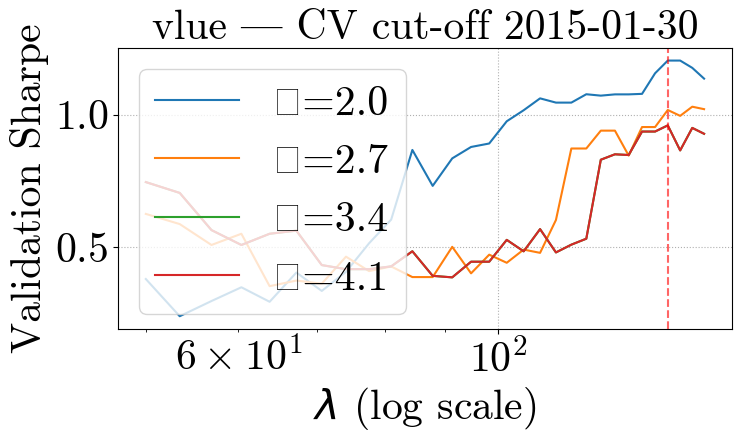

Training data:   2002-08-29 → 2012-07-30, 2409 days  (9.9 years)
Validation data: 2012-07-31 → 2015-07-31, 747 days  (3.0 years)
Best params: λ=129.31, κ=2.71, Sharpe=-0.3087


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


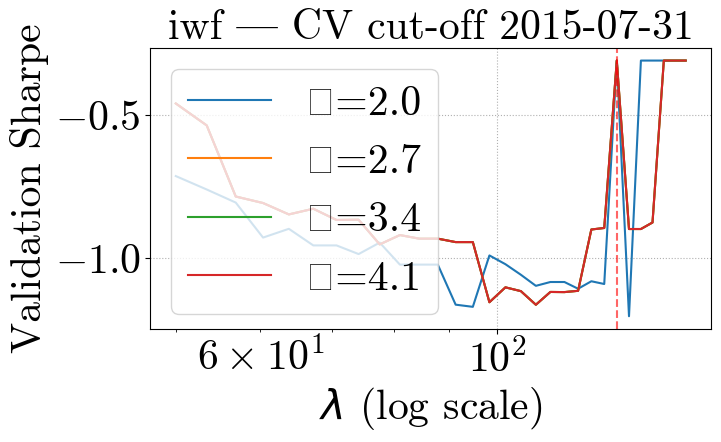

Training data:   2002-08-29 → 2012-07-30, 2409 days  (9.9 years)
Validation data: 2012-07-31 → 2015-07-31, 747 days  (3.0 years)
Best params: λ=81.03, κ=2.00, Sharpe=1.2081


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


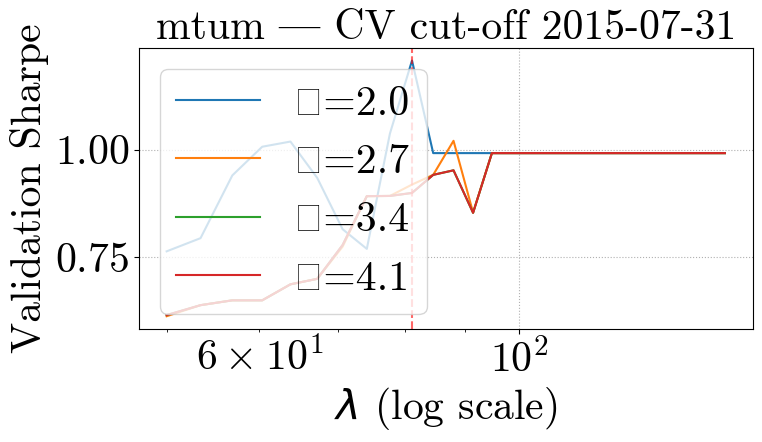

Training data:   2002-08-29 → 2012-07-30, 2409 days  (9.9 years)
Validation data: 2012-07-31 → 2015-07-31, 747 days  (3.0 years)
Best params: λ=105.17, κ=2.71, Sharpe=-0.4300


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


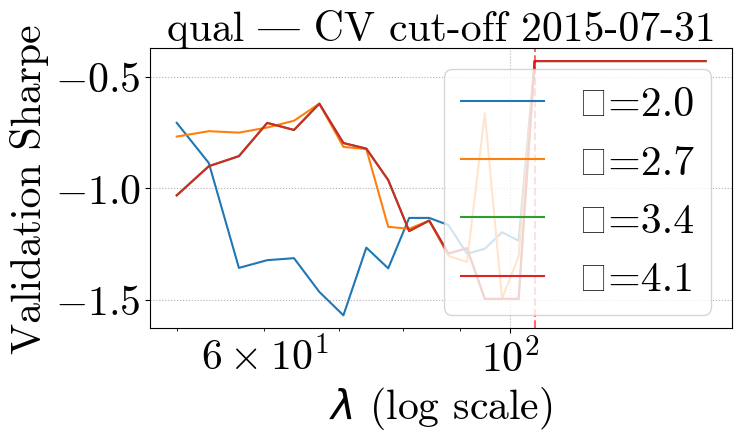

Training data:   2002-08-29 → 2012-07-30, 2409 days  (9.9 years)
Validation data: 2012-07-31 → 2015-07-31, 747 days  (3.0 years)
Best params: λ=53.45, κ=3.42, Sharpe=0.1342


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


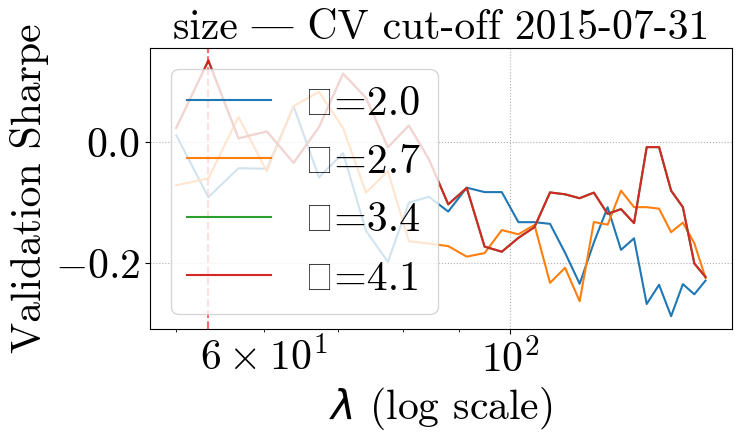

Training data:   2002-08-29 → 2012-07-30, 2409 days  (9.9 years)
Validation data: 2012-07-31 → 2015-07-31, 747 days  (3.0 years)
Best params: λ=56.90, κ=2.71, Sharpe=0.2482


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


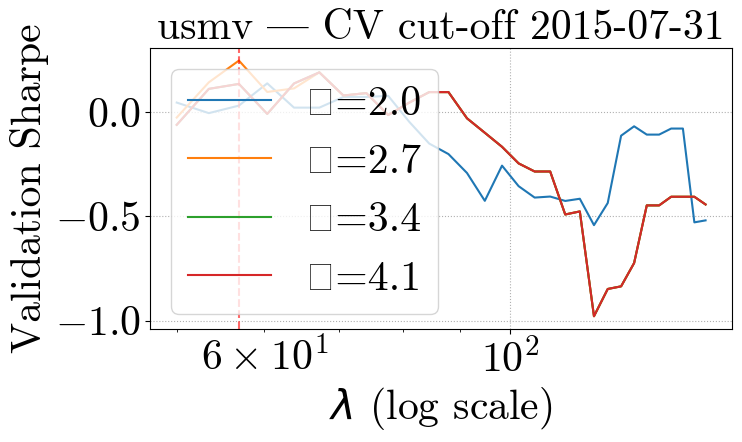

Training data:   2002-08-29 → 2012-07-30, 2409 days  (9.9 years)
Validation data: 2012-07-31 → 2015-07-31, 747 days  (3.0 years)
Best params: λ=115.52, κ=2.71, Sharpe=1.3387


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


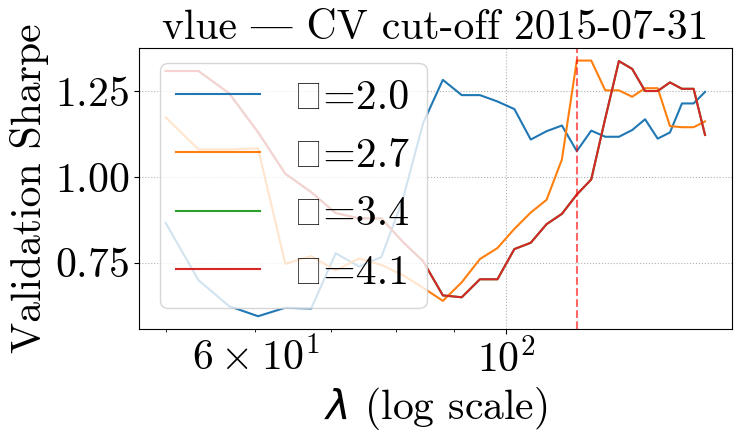

Training data:   2002-08-29 → 2013-01-28, 2526 days  (10.4 years)
Validation data: 2013-01-29 → 2016-01-29, 755 days  (3.0 years)
Best params: λ=53.45, κ=2.71, Sharpe=-0.4378


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


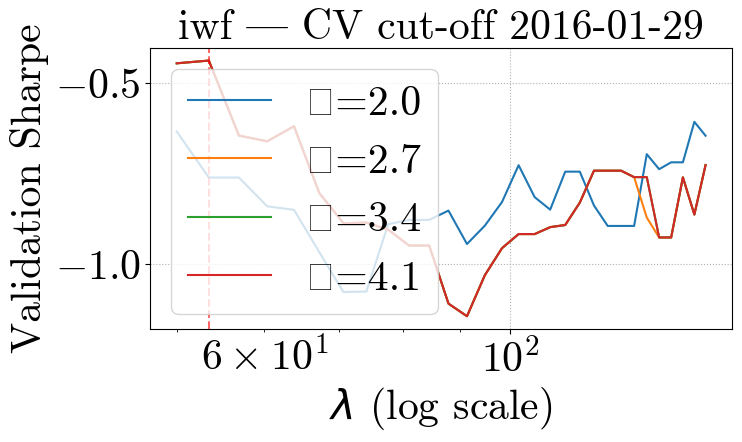

Training data:   2002-08-29 → 2013-01-28, 2526 days  (10.4 years)
Validation data: 2013-01-29 → 2016-01-29, 755 days  (3.0 years)
Best params: λ=136.21, κ=2.71, Sharpe=1.8270


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


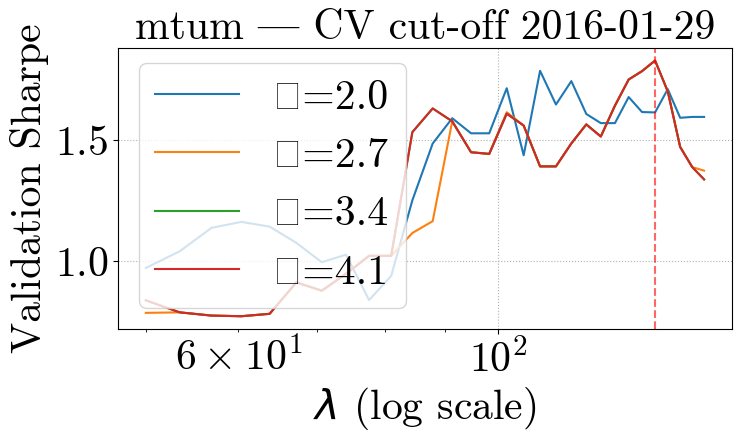

Training data:   2002-08-29 → 2013-01-28, 2526 days  (10.4 years)
Validation data: 2013-01-29 → 2016-01-29, 755 days  (3.0 years)
Best params: λ=60.34, κ=2.71, Sharpe=0.3760


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


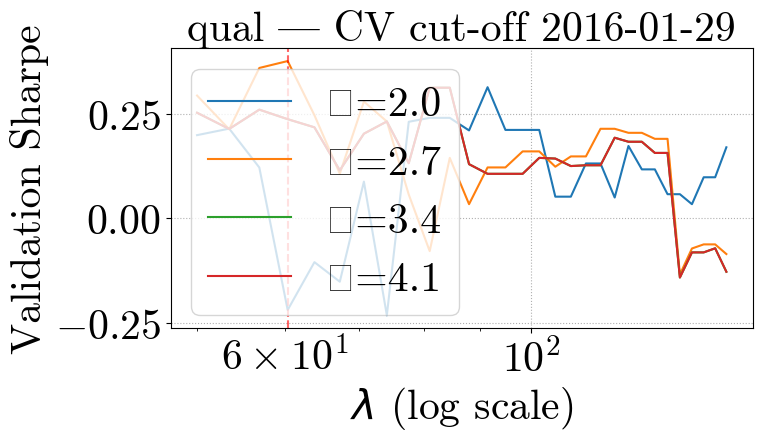

Training data:   2002-08-29 → 2013-01-28, 2526 days  (10.4 years)
Validation data: 2013-01-29 → 2016-01-29, 755 days  (3.0 years)
Best params: λ=50.00, κ=3.42, Sharpe=0.0684


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


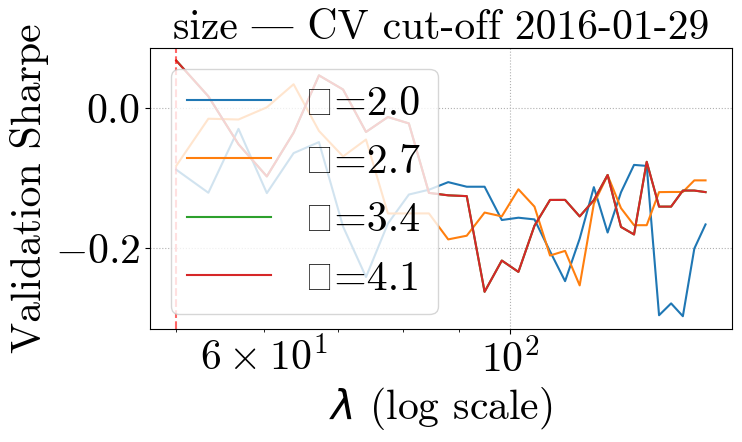

Training data:   2002-08-29 → 2013-01-28, 2526 days  (10.4 years)
Validation data: 2013-01-29 → 2016-01-29, 755 days  (3.0 years)
Best params: λ=63.79, κ=2.00, Sharpe=0.4620


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


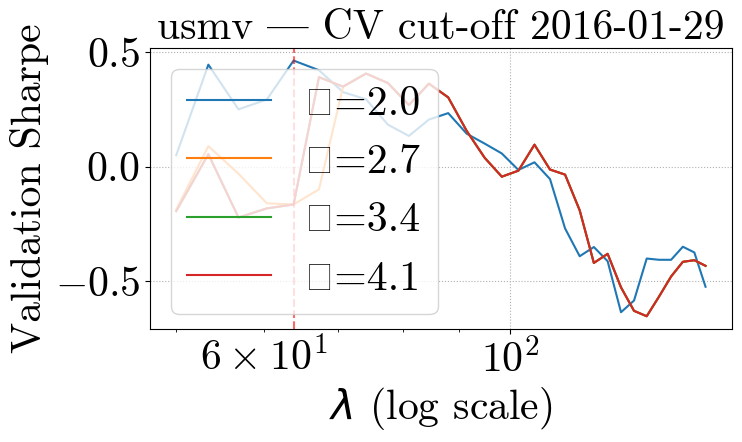

Training data:   2002-08-29 → 2013-01-28, 2526 days  (10.4 years)
Validation data: 2013-01-29 → 2016-01-29, 755 days  (3.0 years)
Best params: λ=63.79, κ=2.71, Sharpe=1.4150


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


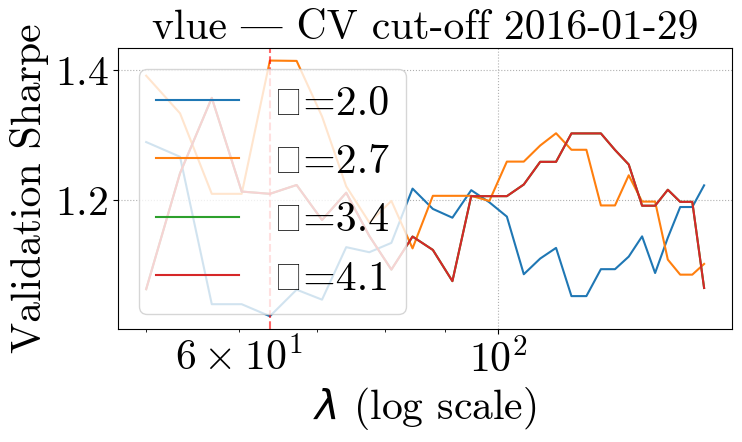

Training data:   2002-08-29 → 2013-07-26, 2649 days  (10.9 years)
Validation data: 2013-07-29 → 2016-07-29, 758 days  (3.0 years)
Best params: λ=50.00, κ=2.71, Sharpe=-0.5367


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


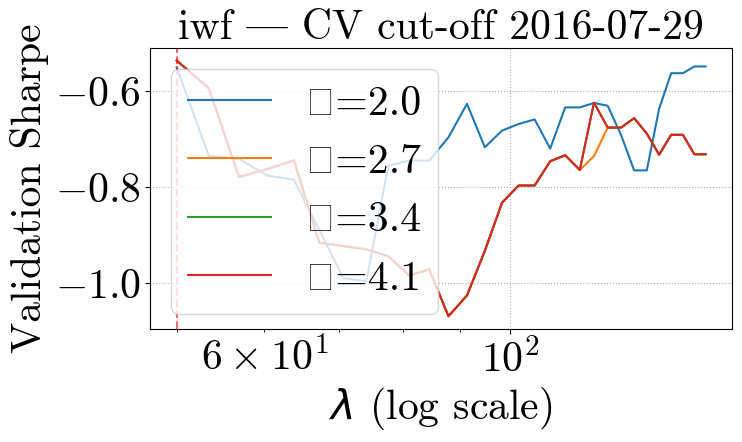

Training data:   2002-08-29 → 2013-07-26, 2649 days  (10.9 years)
Validation data: 2013-07-29 → 2016-07-29, 758 days  (3.0 years)
Best params: λ=143.10, κ=2.71, Sharpe=1.7806


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


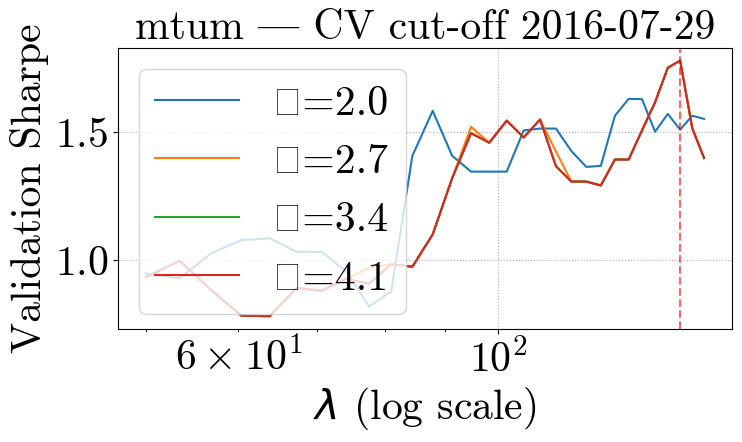

Training data:   2002-08-29 → 2013-07-26, 2649 days  (10.9 years)
Validation data: 2013-07-29 → 2016-07-29, 758 days  (3.0 years)
Best params: λ=60.34, κ=2.71, Sharpe=0.5855


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


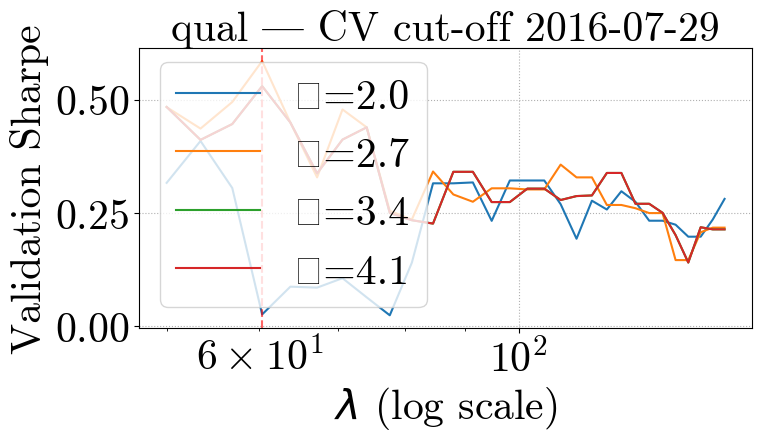

Training data:   2002-08-29 → 2013-07-26, 2649 days  (10.9 years)
Validation data: 2013-07-29 → 2016-07-29, 758 days  (3.0 years)
Best params: λ=53.45, κ=2.00, Sharpe=0.2828


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


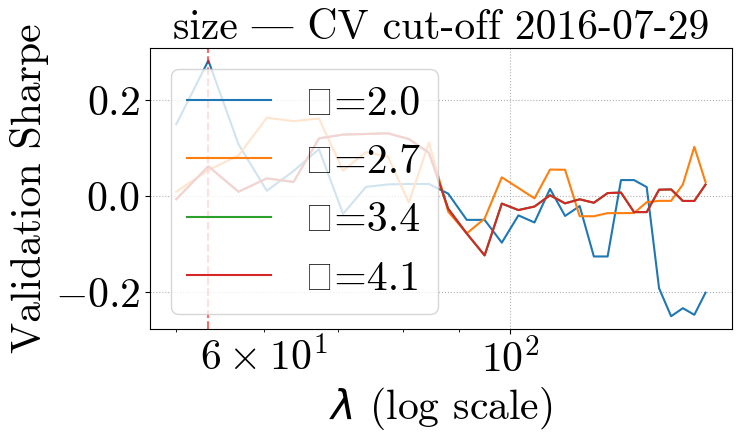

Training data:   2002-08-29 → 2013-07-26, 2649 days  (10.9 years)
Validation data: 2013-07-29 → 2016-07-29, 758 days  (3.0 years)
Best params: λ=67.24, κ=2.00, Sharpe=0.7223


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


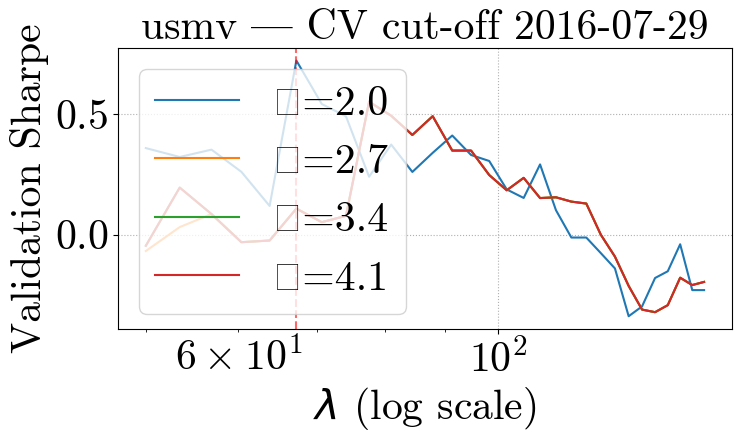

Training data:   2002-08-29 → 2013-07-26, 2649 days  (10.9 years)
Validation data: 2013-07-29 → 2016-07-29, 758 days  (3.0 years)
Best params: λ=125.86, κ=2.71, Sharpe=0.5364


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


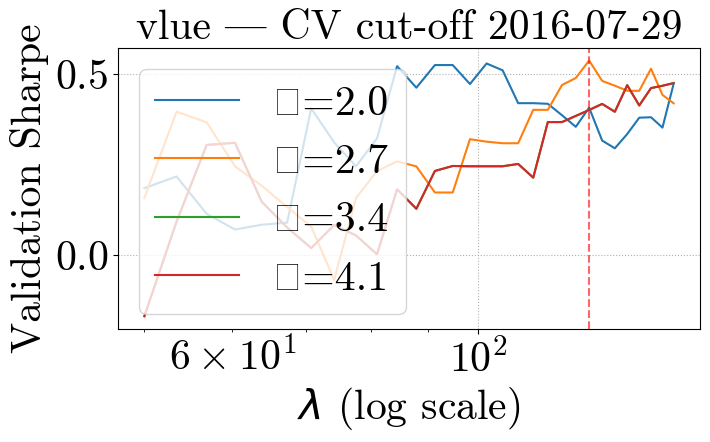

Training data:   2002-08-29 → 2014-01-30, 2778 days  (11.4 years)
Validation data: 2014-01-31 → 2017-01-31, 756 days  (3.0 years)
Best params: λ=143.10, κ=2.00, Sharpe=-0.2140


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


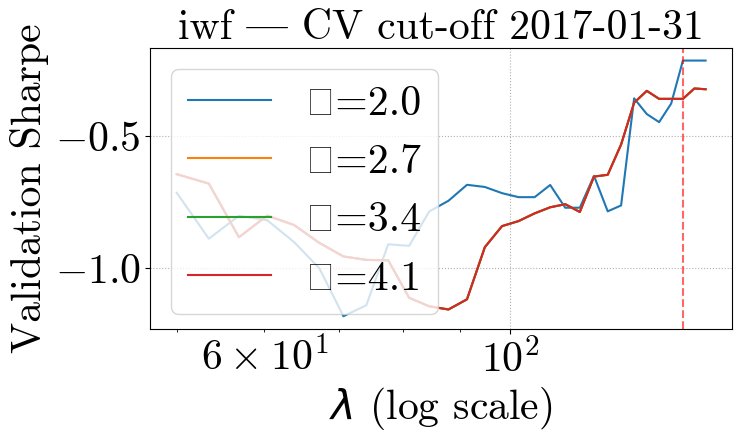

Training data:   2002-08-29 → 2014-01-30, 2778 days  (11.4 years)
Validation data: 2014-01-31 → 2017-01-31, 756 days  (3.0 years)
Best params: λ=98.28, κ=2.71, Sharpe=1.5650


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


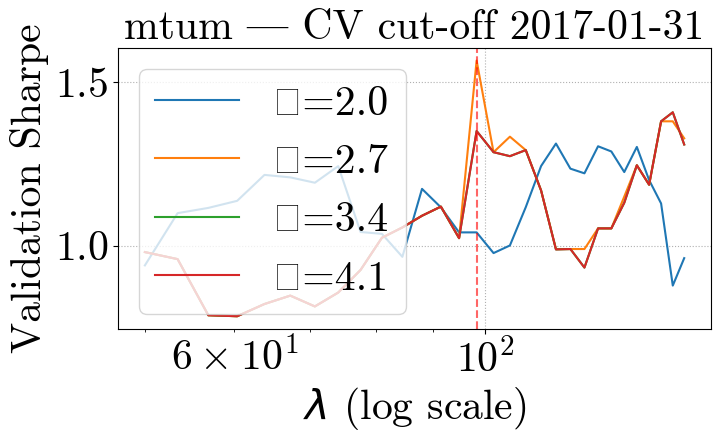

Training data:   2002-08-29 → 2014-01-30, 2778 days  (11.4 years)
Validation data: 2014-01-31 → 2017-01-31, 756 days  (3.0 years)
Best params: λ=125.86, κ=2.00, Sharpe=0.5768


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


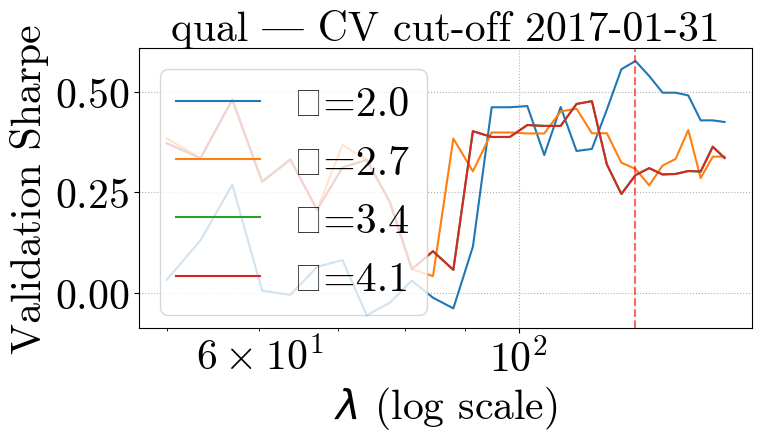

Training data:   2002-08-29 → 2014-01-30, 2778 days  (11.4 years)
Validation data: 2014-01-31 → 2017-01-31, 756 days  (3.0 years)
Best params: λ=50.00, κ=2.71, Sharpe=0.3360


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


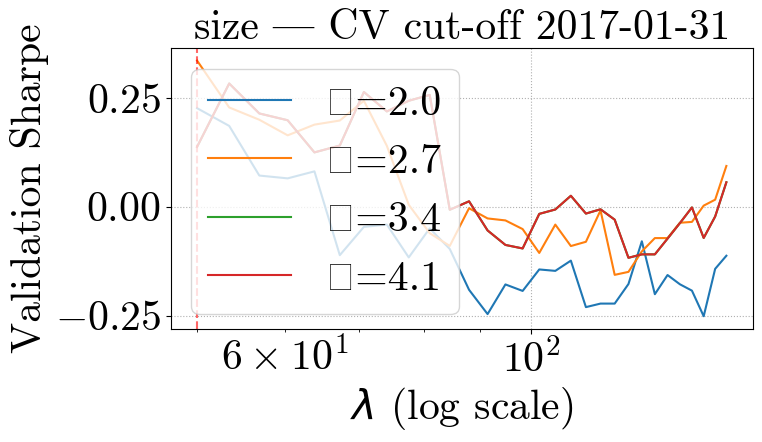

Training data:   2002-08-29 → 2014-01-30, 2778 days  (11.4 years)
Validation data: 2014-01-31 → 2017-01-31, 756 days  (3.0 years)
Best params: λ=53.45, κ=2.00, Sharpe=0.1355


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


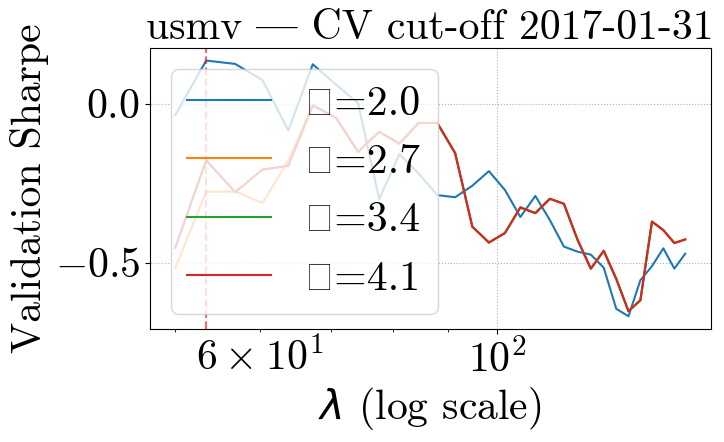

Training data:   2002-08-29 → 2014-01-30, 2778 days  (11.4 years)
Validation data: 2014-01-31 → 2017-01-31, 756 days  (3.0 years)
Best params: λ=125.86, κ=2.71, Sharpe=1.0029


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


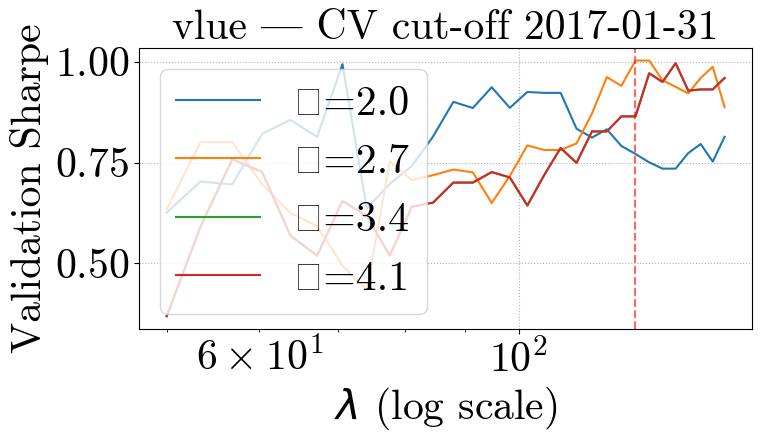

Training data:   2002-08-29 → 2014-07-30, 2903 days  (11.9 years)
Validation data: 2014-07-31 → 2017-07-31, 756 days  (3.0 years)
Best params: λ=146.55, κ=2.00, Sharpe=-0.4466


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


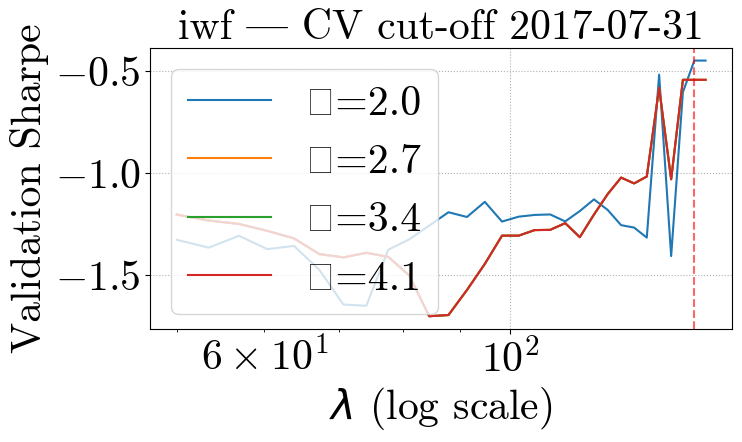

Training data:   2002-08-29 → 2014-07-30, 2903 days  (11.9 years)
Validation data: 2014-07-31 → 2017-07-31, 756 days  (3.0 years)
Best params: λ=94.83, κ=2.71, Sharpe=2.1558


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


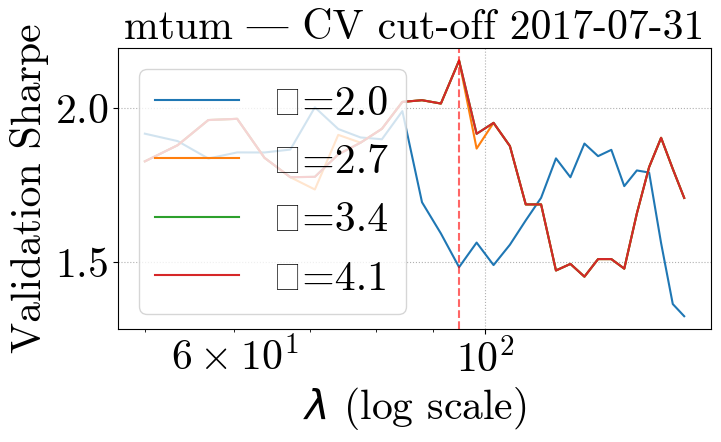

Training data:   2002-08-29 → 2014-07-30, 2903 days  (11.9 years)
Validation data: 2014-07-31 → 2017-07-31, 756 days  (3.0 years)
Best params: λ=56.90, κ=2.71, Sharpe=0.5419


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


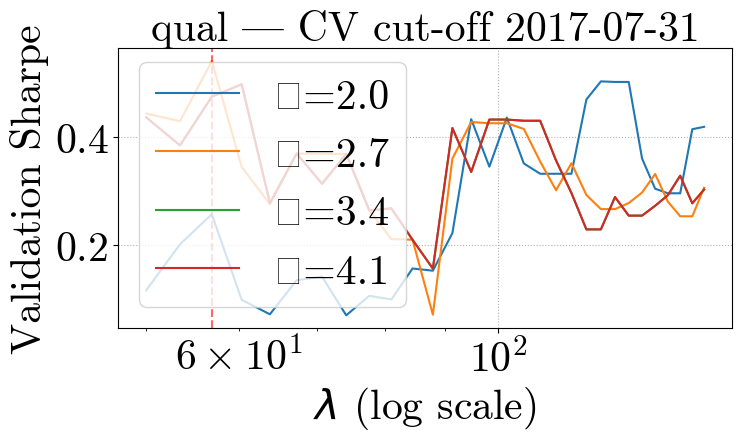

Training data:   2002-08-29 → 2014-07-30, 2903 days  (11.9 years)
Validation data: 2014-07-31 → 2017-07-31, 756 days  (3.0 years)
Best params: λ=74.14, κ=3.42, Sharpe=0.6429


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


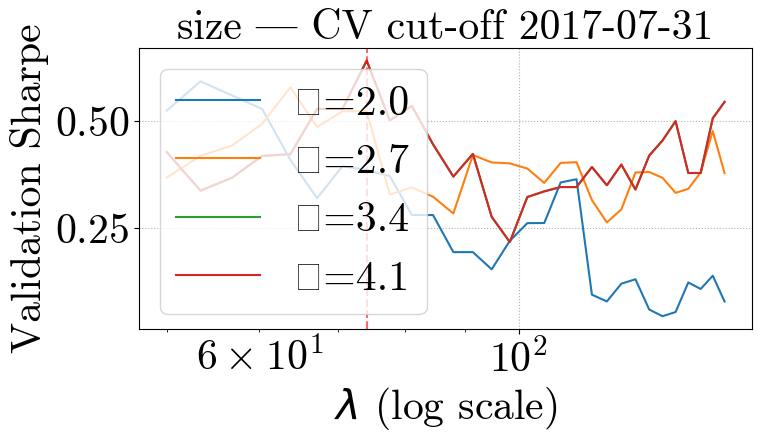

Training data:   2002-08-29 → 2014-07-30, 2903 days  (11.9 years)
Validation data: 2014-07-31 → 2017-07-31, 756 days  (3.0 years)
Best params: λ=67.24, κ=2.00, Sharpe=0.1679


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


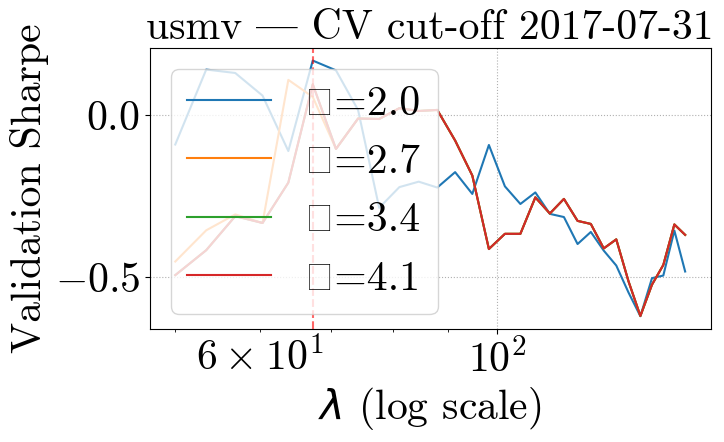

Training data:   2002-08-29 → 2014-07-30, 2903 days  (11.9 years)
Validation data: 2014-07-31 → 2017-07-31, 756 days  (3.0 years)
Best params: λ=105.17, κ=2.00, Sharpe=0.3945


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


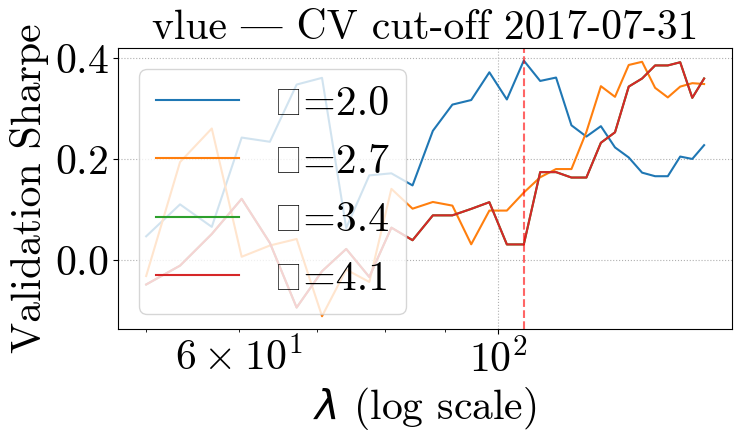

Training data:   2003-01-30 → 2015-01-30, 2930 days  (12.0 years)
Validation data: 2015-02-02 → 2018-01-31, 756 days  (3.0 years)
Best params: λ=112.07, κ=2.00, Sharpe=-0.5111


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


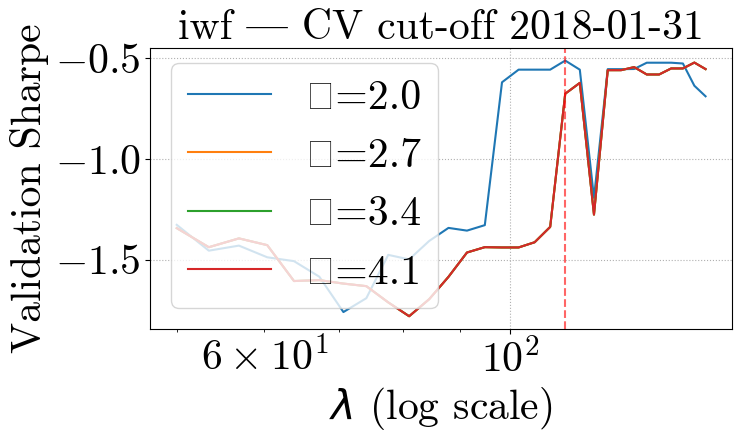

Training data:   2003-01-30 → 2015-01-30, 2930 days  (12.0 years)
Validation data: 2015-02-02 → 2018-01-31, 756 days  (3.0 years)
Best params: λ=53.45, κ=2.71, Sharpe=2.3471


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


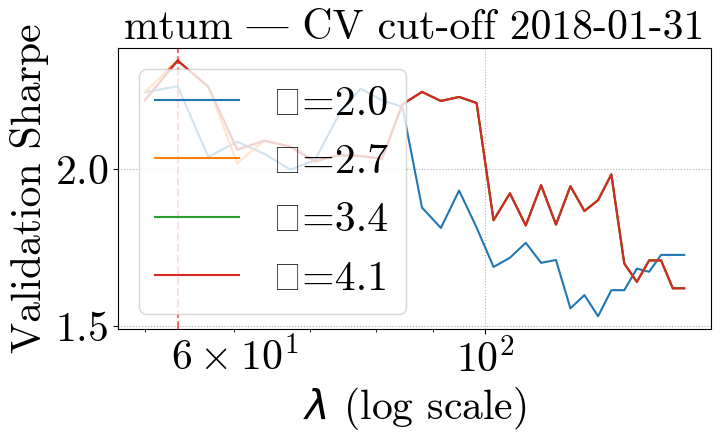

Training data:   2003-01-30 → 2015-01-30, 2930 days  (12.0 years)
Validation data: 2015-02-02 → 2018-01-31, 756 days  (3.0 years)
Best params: λ=108.62, κ=2.00, Sharpe=0.6772


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


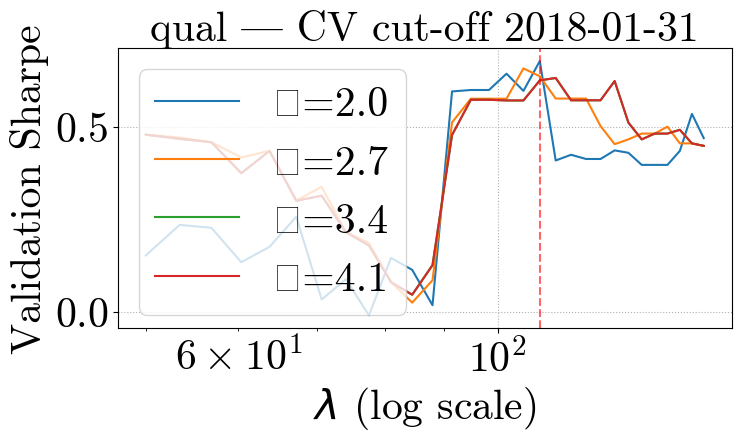

Training data:   2003-01-30 → 2015-01-30, 2930 days  (12.0 years)
Validation data: 2015-02-02 → 2018-01-31, 756 days  (3.0 years)
Best params: λ=53.45, κ=2.00, Sharpe=0.3917


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


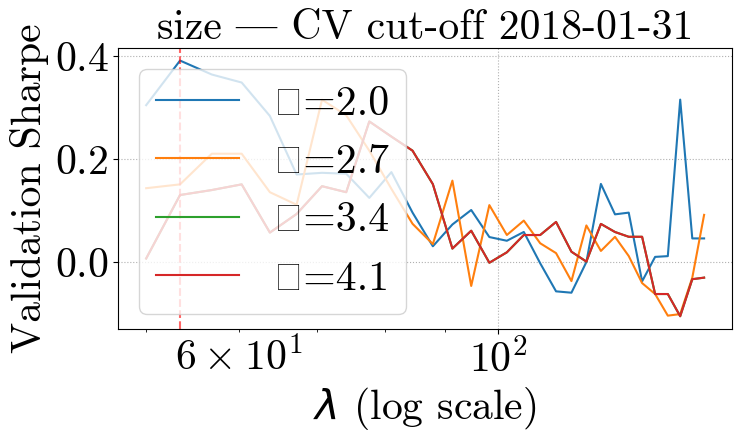

Training data:   2003-01-30 → 2015-01-30, 2930 days  (12.0 years)
Validation data: 2015-02-02 → 2018-01-31, 756 days  (3.0 years)
Best params: λ=63.79, κ=2.71, Sharpe=0.3252


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


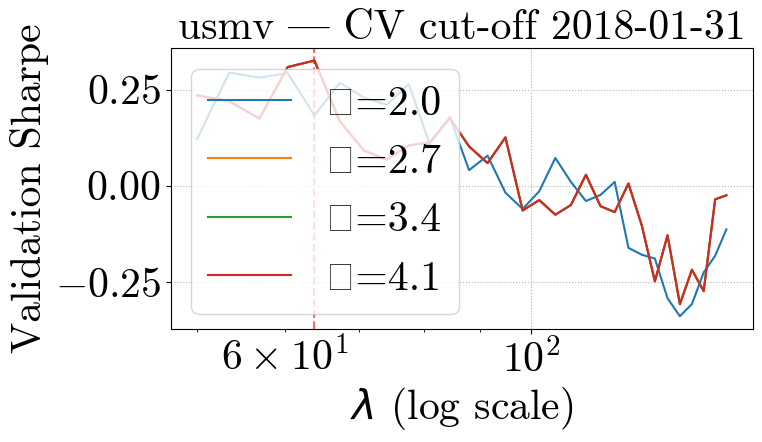

Training data:   2003-01-30 → 2015-01-30, 2930 days  (12.0 years)
Validation data: 2015-02-02 → 2018-01-31, 756 days  (3.0 years)
Best params: λ=74.14, κ=2.00, Sharpe=0.6561


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


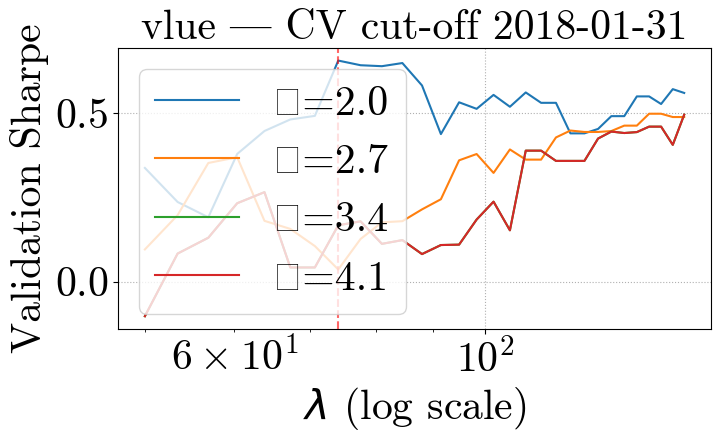

Training data:   2003-07-30 → 2015-07-30, 2934 days  (12.0 years)
Validation data: 2015-07-31 → 2018-07-31, 756 days  (3.0 years)
Best params: λ=77.59, κ=2.71, Sharpe=0.9983


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


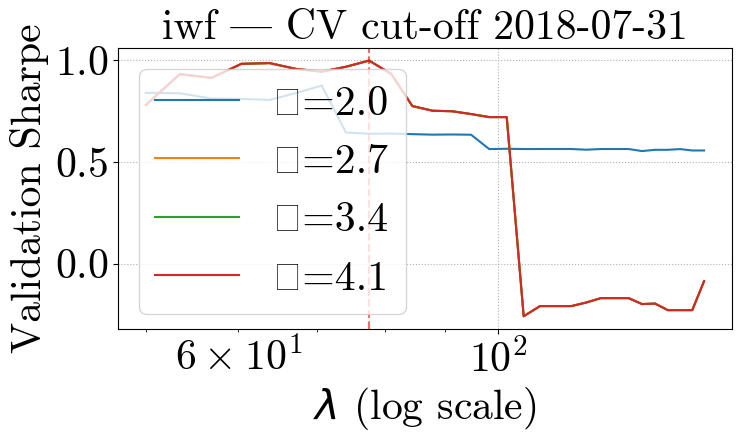

Training data:   2003-07-30 → 2015-07-30, 2934 days  (12.0 years)
Validation data: 2015-07-31 → 2018-07-31, 756 days  (3.0 years)
Best params: λ=81.03, κ=2.00, Sharpe=1.8719


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


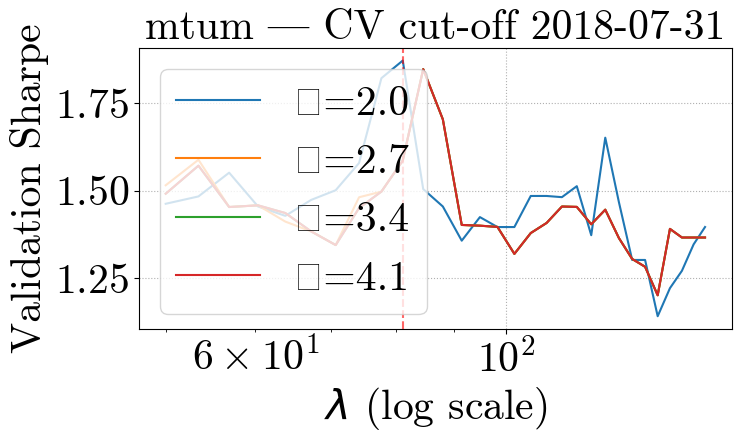

Training data:   2003-07-30 → 2015-07-30, 2934 days  (12.0 years)
Validation data: 2015-07-31 → 2018-07-31, 756 days  (3.0 years)
Best params: λ=98.28, κ=2.00, Sharpe=0.7259


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


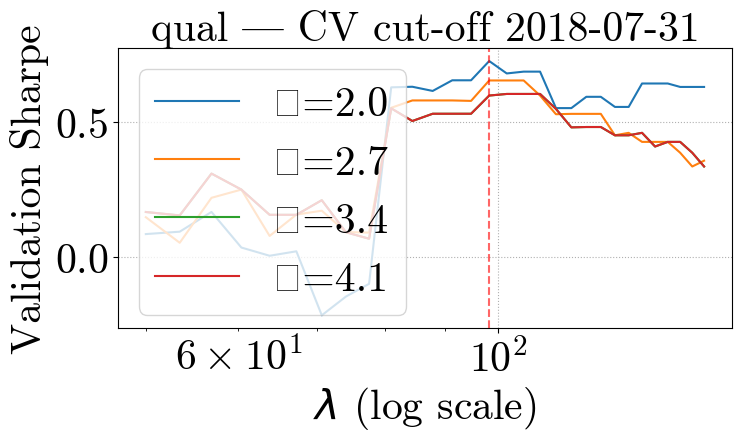

Training data:   2003-07-30 → 2015-07-30, 2934 days  (12.0 years)
Validation data: 2015-07-31 → 2018-07-31, 756 days  (3.0 years)
Best params: λ=60.34, κ=2.00, Sharpe=0.3839


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


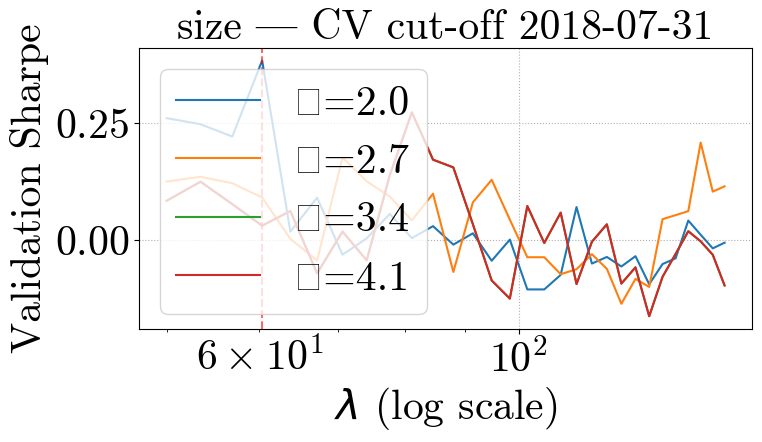

Training data:   2003-07-30 → 2015-07-30, 2934 days  (12.0 years)
Validation data: 2015-07-31 → 2018-07-31, 756 days  (3.0 years)
Best params: λ=150.00, κ=2.00, Sharpe=-0.2036


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


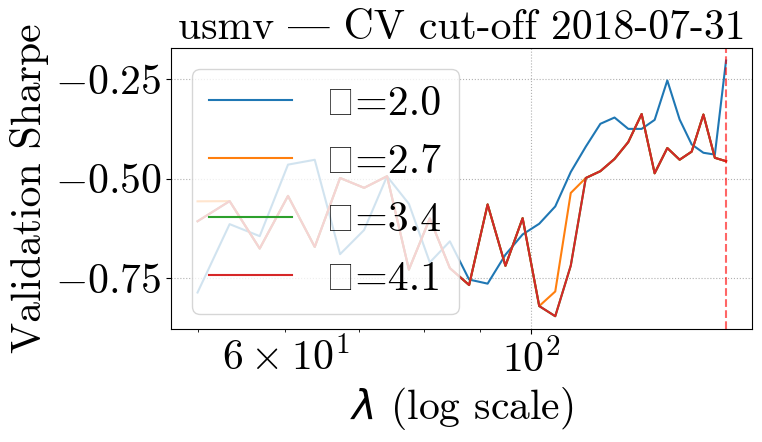

Training data:   2003-07-30 → 2015-07-30, 2934 days  (12.0 years)
Validation data: 2015-07-31 → 2018-07-31, 756 days  (3.0 years)
Best params: λ=125.86, κ=2.00, Sharpe=0.9862


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


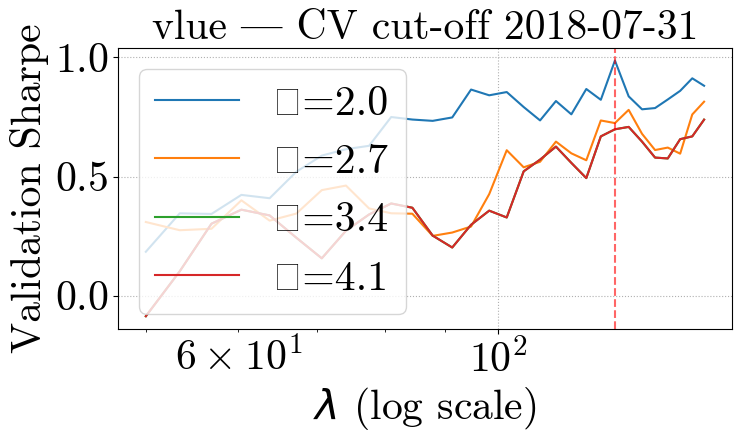

Training data:   2004-01-30 → 2016-01-29, 2938 days  (12.0 years)
Validation data: 2016-02-01 → 2019-01-31, 756 days  (3.0 years)
Best params: λ=67.24, κ=2.71, Sharpe=0.9860


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


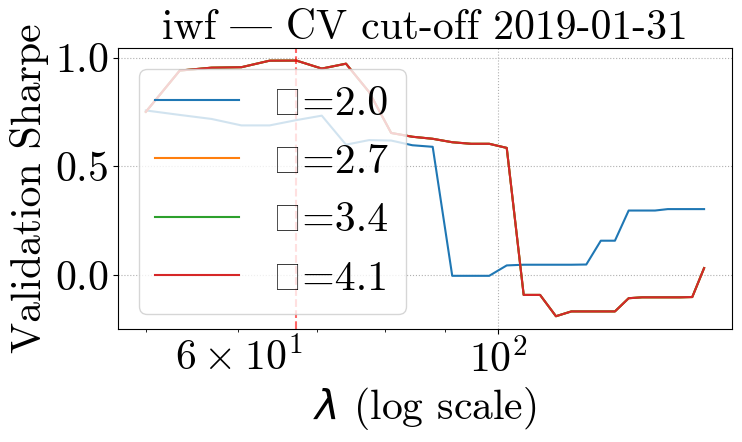

Training data:   2004-01-30 → 2016-01-29, 2938 days  (12.0 years)
Validation data: 2016-02-01 → 2019-01-31, 756 days  (3.0 years)
Best params: λ=81.03, κ=2.00, Sharpe=1.4950


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


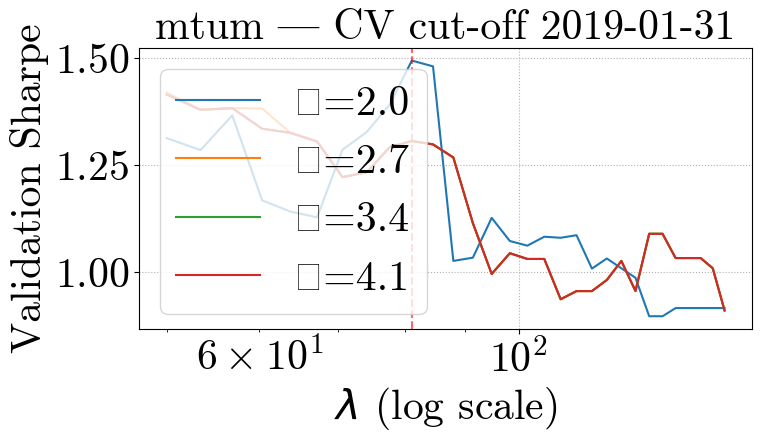

Training data:   2004-01-30 → 2016-01-29, 2938 days  (12.0 years)
Validation data: 2016-02-01 → 2019-01-31, 756 days  (3.0 years)
Best params: λ=84.48, κ=3.42, Sharpe=0.1085


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


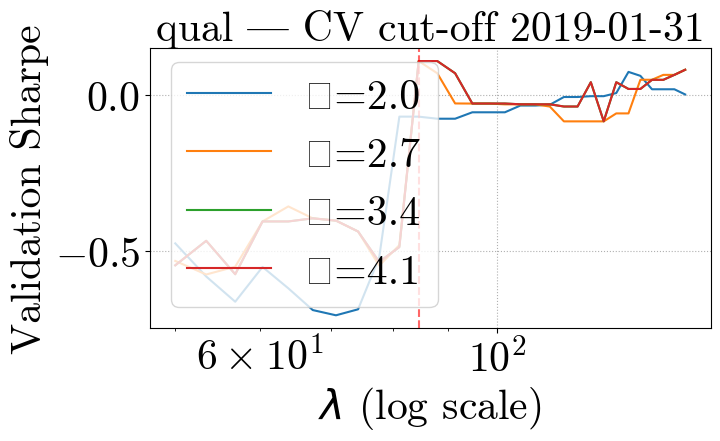

Training data:   2004-01-30 → 2016-01-29, 2938 days  (12.0 years)
Validation data: 2016-02-01 → 2019-01-31, 756 days  (3.0 years)
Best params: λ=150.00, κ=2.71, Sharpe=0.2763


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


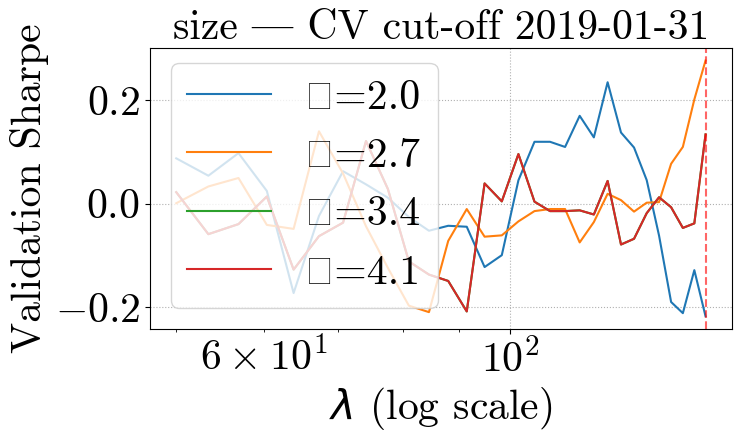

Training data:   2004-01-30 → 2016-01-29, 2938 days  (12.0 years)
Validation data: 2016-02-01 → 2019-01-31, 756 days  (3.0 years)
Best params: λ=129.31, κ=2.71, Sharpe=0.0939


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


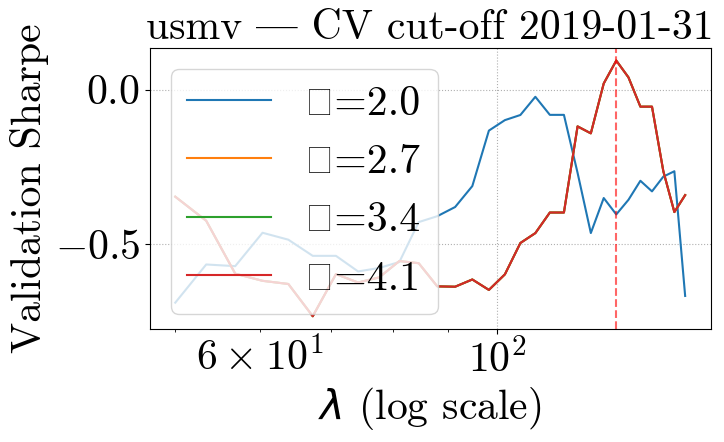

Training data:   2004-01-30 → 2016-01-29, 2938 days  (12.0 years)
Validation data: 2016-02-01 → 2019-01-31, 756 days  (3.0 years)
Best params: λ=136.21, κ=2.00, Sharpe=1.0608


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


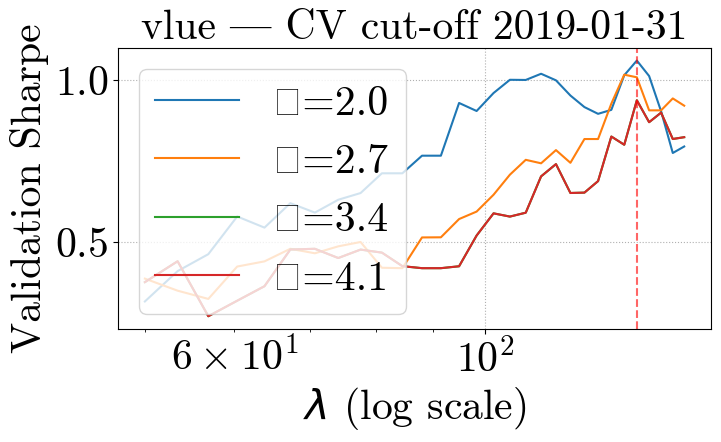

Training data:   2004-07-30 → 2016-07-29, 2944 days  (12.0 years)
Validation data: 2016-08-01 → 2019-07-31, 755 days  (3.0 years)
Best params: λ=67.24, κ=2.00, Sharpe=1.0574


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


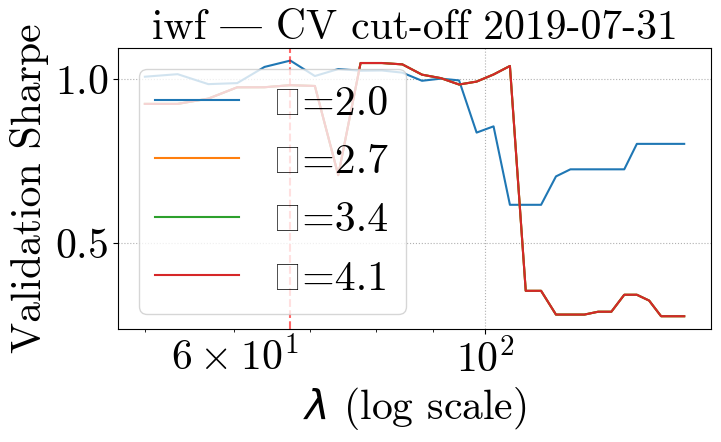

Training data:   2004-07-30 → 2016-07-29, 2944 days  (12.0 years)
Validation data: 2016-08-01 → 2019-07-31, 755 days  (3.0 years)
Best params: λ=87.93, κ=2.00, Sharpe=1.7262


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


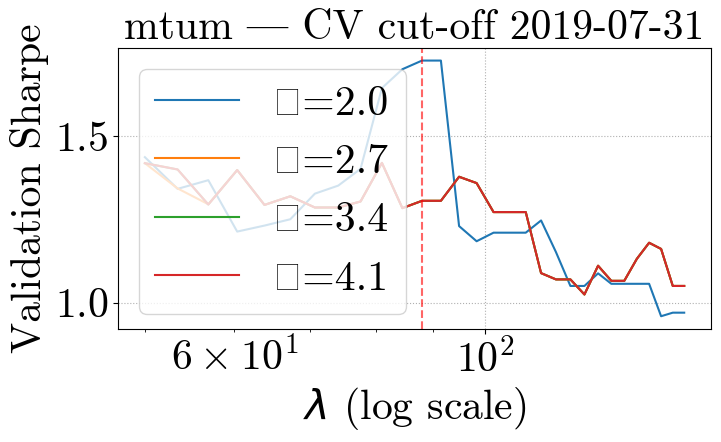

Training data:   2004-07-30 → 2016-07-29, 2944 days  (12.0 years)
Validation data: 2016-08-01 → 2019-07-31, 755 days  (3.0 years)
Best params: λ=146.55, κ=2.00, Sharpe=0.3936


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


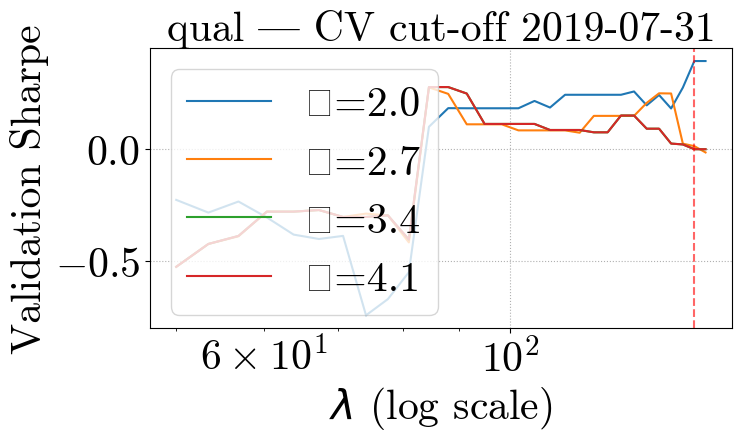

Training data:   2004-07-30 → 2016-07-29, 2944 days  (12.0 years)
Validation data: 2016-08-01 → 2019-07-31, 755 days  (3.0 years)
Best params: λ=125.86, κ=2.00, Sharpe=0.1847


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


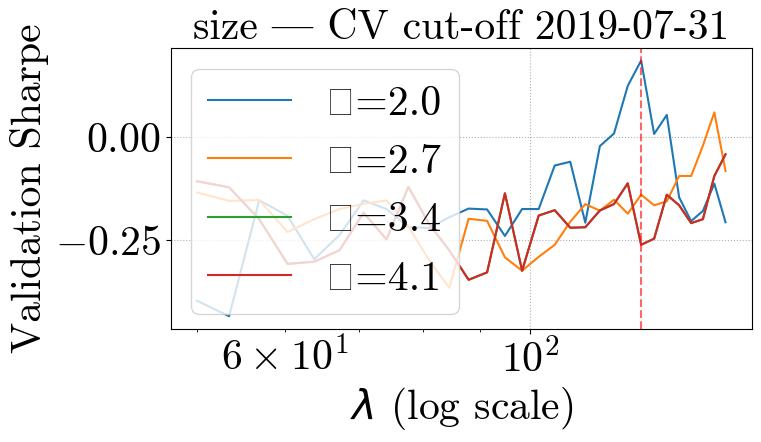

Training data:   2004-07-30 → 2016-07-29, 2944 days  (12.0 years)
Validation data: 2016-08-01 → 2019-07-31, 755 days  (3.0 years)
Best params: λ=143.10, κ=2.71, Sharpe=-0.0111


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


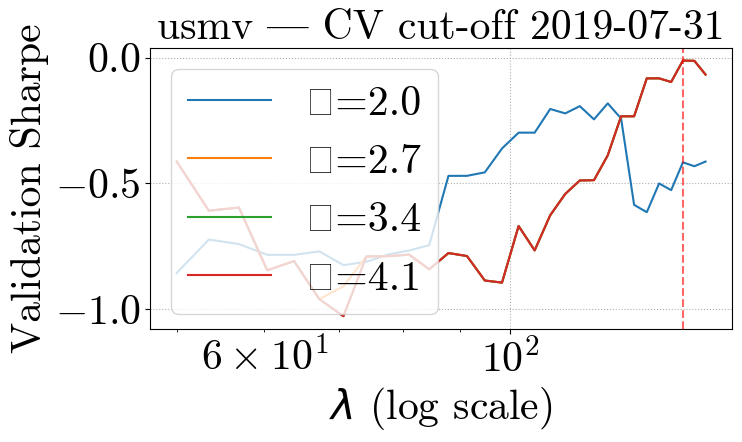

Training data:   2004-07-30 → 2016-07-29, 2944 days  (12.0 years)
Validation data: 2016-08-01 → 2019-07-31, 755 days  (3.0 years)
Best params: λ=139.66, κ=3.42, Sharpe=1.0277


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


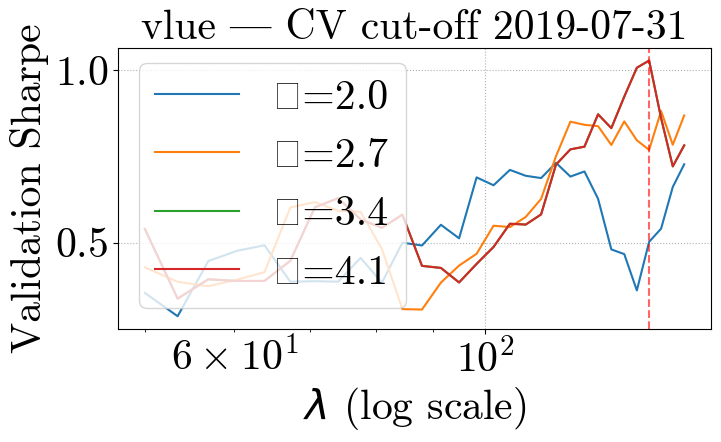

Training data:   2005-01-31 → 2017-01-30, 2947 days  (12.0 years)
Validation data: 2017-01-31 → 2020-01-31, 756 days  (3.0 years)
Best params: λ=67.24, κ=2.00, Sharpe=1.3280


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


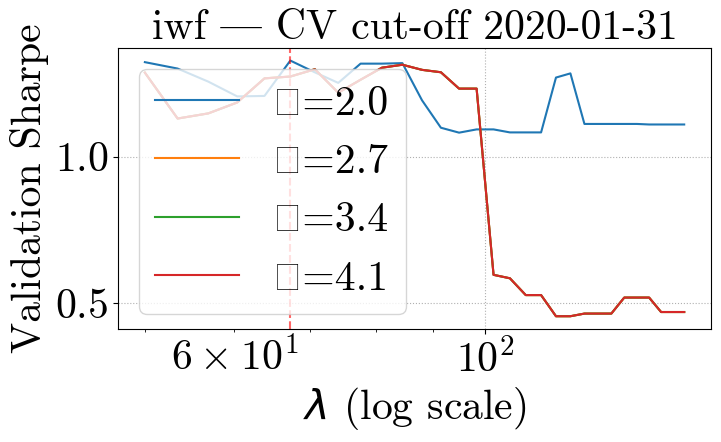

Training data:   2005-01-31 → 2017-01-30, 2947 days  (12.0 years)
Validation data: 2017-01-31 → 2020-01-31, 756 days  (3.0 years)
Best params: λ=50.00, κ=2.00, Sharpe=1.4936


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


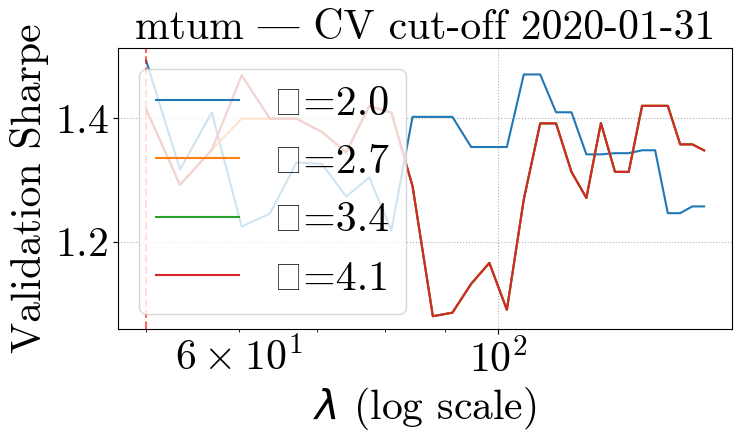

Training data:   2005-01-31 → 2017-01-30, 2947 days  (12.0 years)
Validation data: 2017-01-31 → 2020-01-31, 756 days  (3.0 years)
Best params: λ=84.48, κ=3.42, Sharpe=0.2171


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


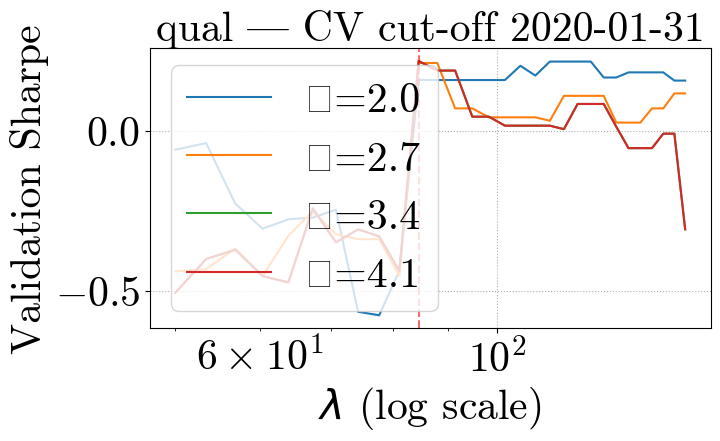

Training data:   2005-01-31 → 2017-01-30, 2947 days  (12.0 years)
Validation data: 2017-01-31 → 2020-01-31, 756 days  (3.0 years)
Best params: λ=129.31, κ=2.71, Sharpe=0.0622


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


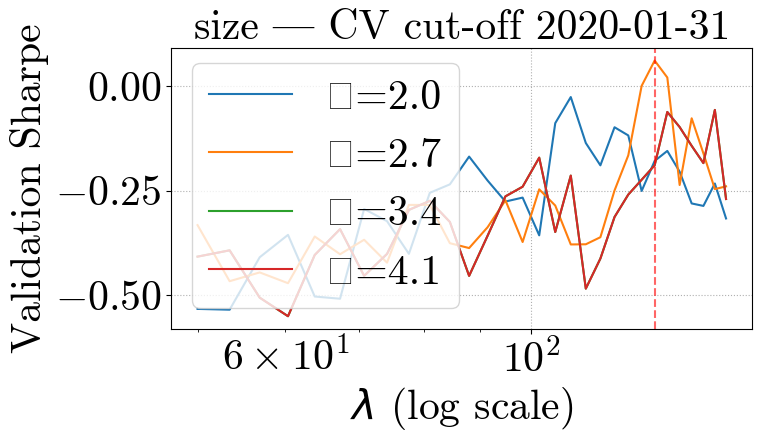

Training data:   2005-01-31 → 2017-01-30, 2947 days  (12.0 years)
Validation data: 2017-01-31 → 2020-01-31, 756 days  (3.0 years)
Best params: λ=136.21, κ=2.71, Sharpe=0.1475


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


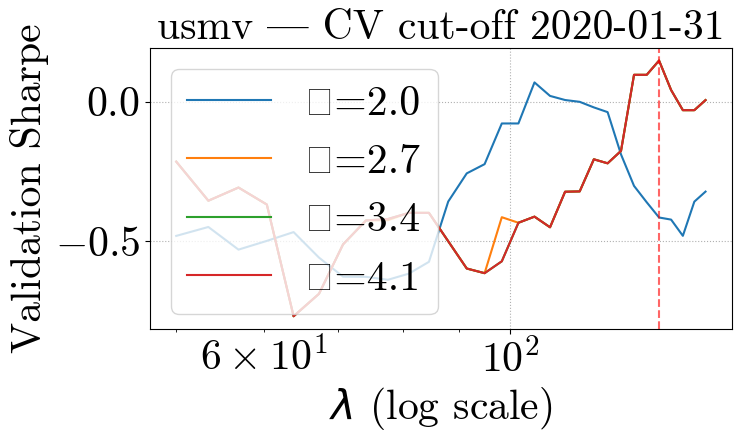

Training data:   2005-01-31 → 2017-01-30, 2947 days  (12.0 years)
Validation data: 2017-01-31 → 2020-01-31, 756 days  (3.0 years)
Best params: λ=122.41, κ=3.42, Sharpe=-0.2376


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


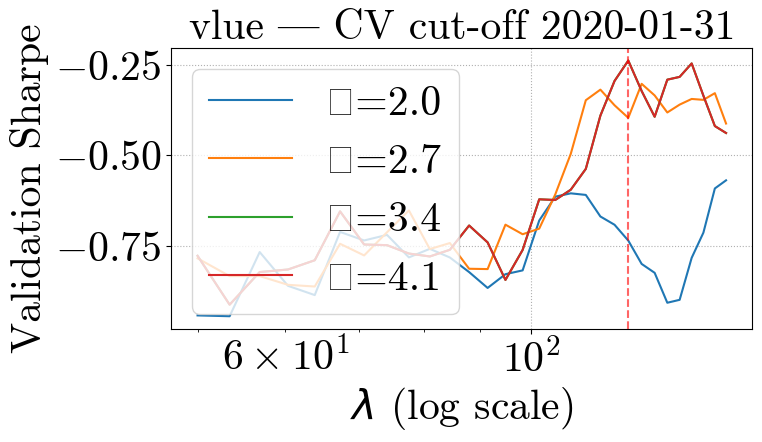

Training data:   2005-08-01 → 2017-07-28, 2950 days  (12.0 years)
Validation data: 2017-07-31 → 2020-07-31, 757 days  (3.0 years)
Best params: λ=112.07, κ=2.00, Sharpe=1.5357


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


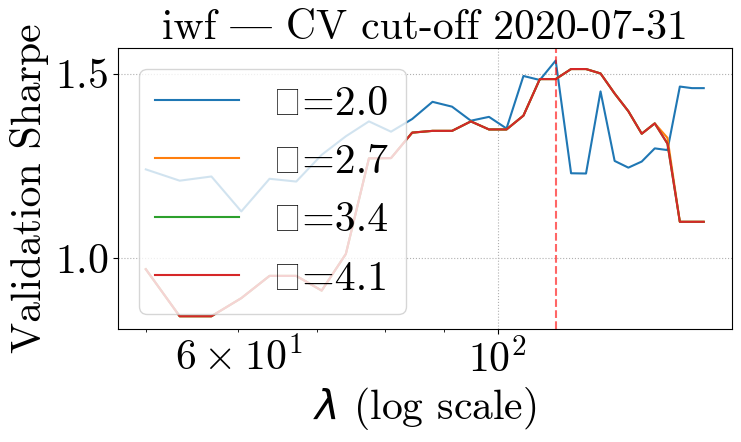

Training data:   2005-08-01 → 2017-07-28, 2950 days  (12.0 years)
Validation data: 2017-07-31 → 2020-07-31, 757 days  (3.0 years)
Best params: λ=108.62, κ=2.00, Sharpe=0.9604


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


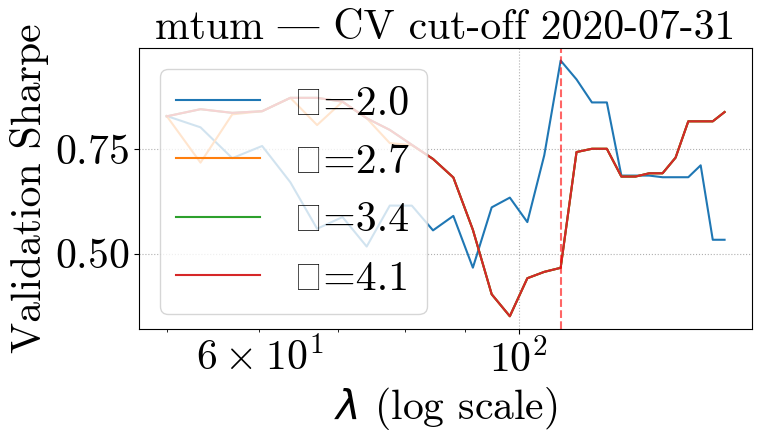

Training data:   2005-08-01 → 2017-07-28, 2950 days  (12.0 years)
Validation data: 2017-07-31 → 2020-07-31, 757 days  (3.0 years)
Best params: λ=53.45, κ=2.00, Sharpe=0.2749


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


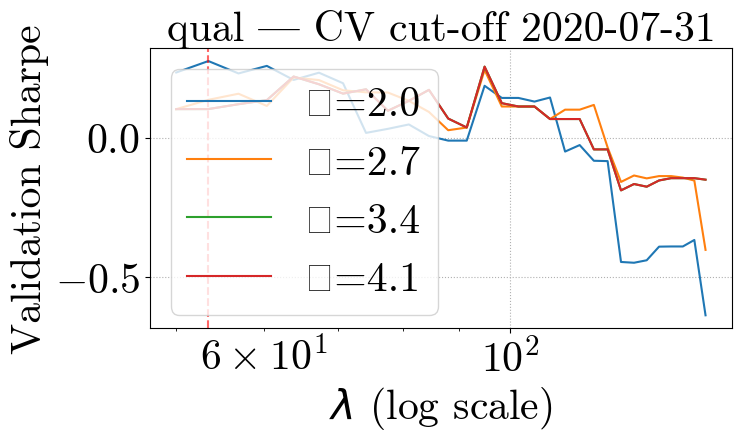

Training data:   2005-08-01 → 2017-07-28, 2950 days  (12.0 years)
Validation data: 2017-07-31 → 2020-07-31, 757 days  (3.0 years)
Best params: λ=139.66, κ=2.00, Sharpe=0.1213


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


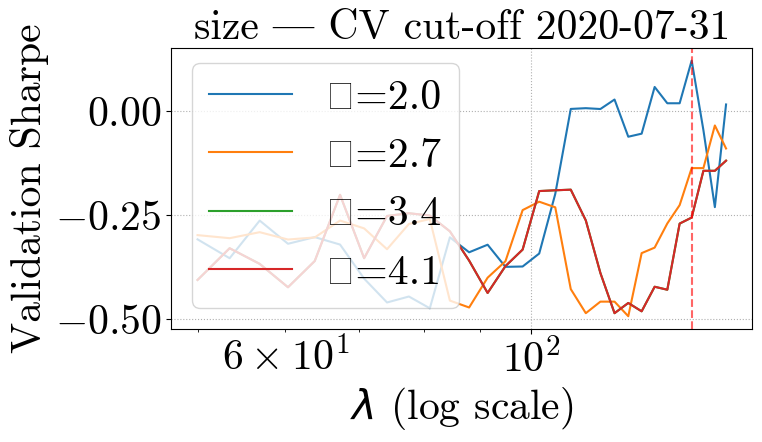

Training data:   2005-08-01 → 2017-07-28, 2950 days  (12.0 years)
Validation data: 2017-07-31 → 2020-07-31, 757 days  (3.0 years)
Best params: λ=50.00, κ=2.71, Sharpe=-0.4151


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


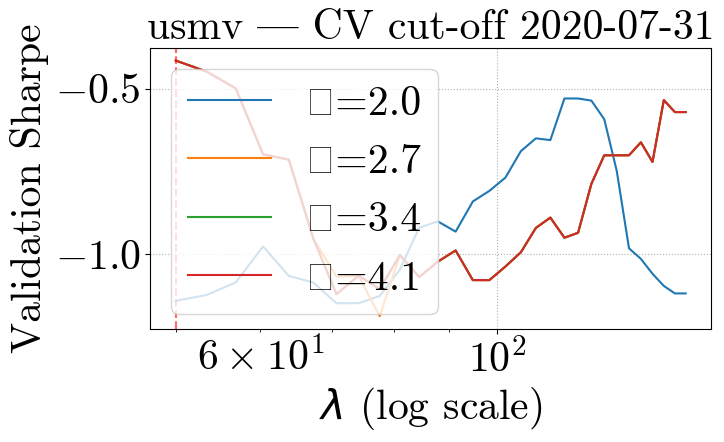

Training data:   2005-08-01 → 2017-07-28, 2950 days  (12.0 years)
Validation data: 2017-07-31 → 2020-07-31, 757 days  (3.0 years)
Best params: λ=143.10, κ=2.71, Sharpe=0.3873


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


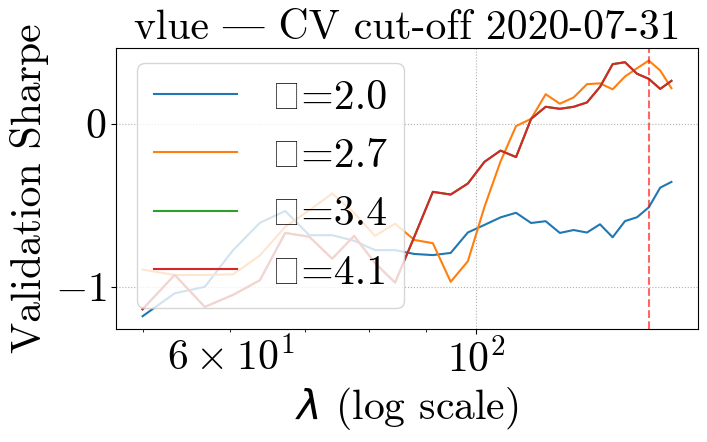

Training data:   2006-01-30 → 2018-01-26, 2955 days  (12.0 years)
Validation data: 2018-01-29 → 2021-01-29, 757 days  (3.0 years)
Best params: λ=139.66, κ=2.00, Sharpe=0.9125


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


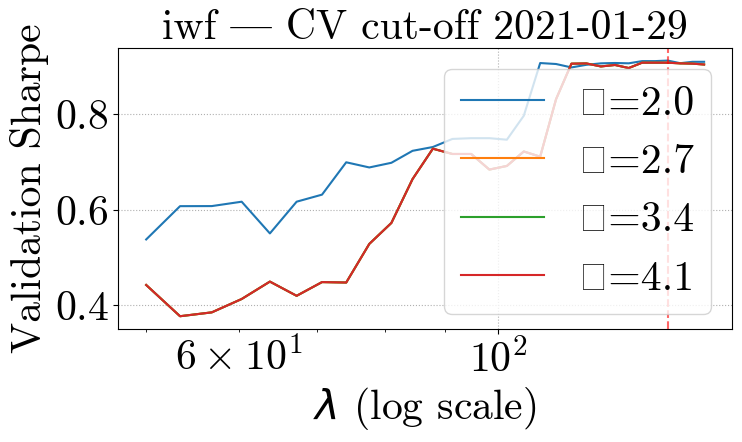

Training data:   2006-01-30 → 2018-01-26, 2955 days  (12.0 years)
Validation data: 2018-01-29 → 2021-01-29, 757 days  (3.0 years)
Best params: λ=146.55, κ=3.42, Sharpe=0.7313


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


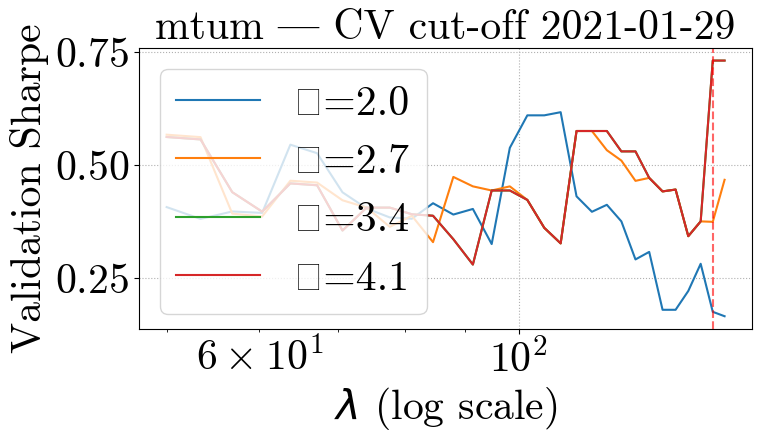

Training data:   2006-01-30 → 2018-01-26, 2955 days  (12.0 years)
Validation data: 2018-01-29 → 2021-01-29, 757 days  (3.0 years)
Best params: λ=84.48, κ=3.42, Sharpe=0.3041


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


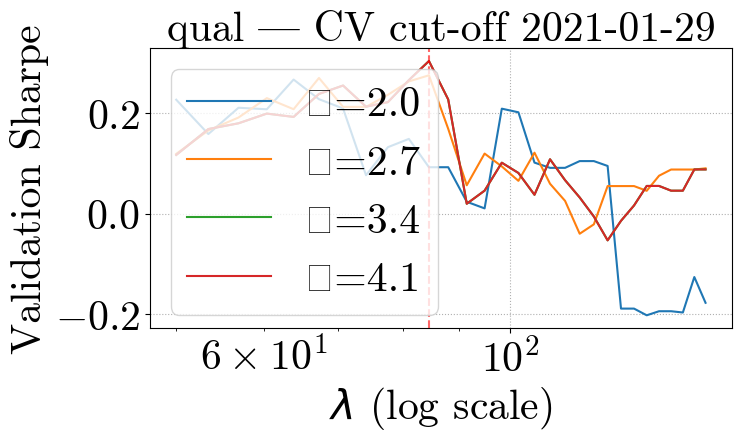

Training data:   2006-01-30 → 2018-01-26, 2955 days  (12.0 years)
Validation data: 2018-01-29 → 2021-01-29, 757 days  (3.0 years)
Best params: λ=139.66, κ=2.00, Sharpe=0.3332


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


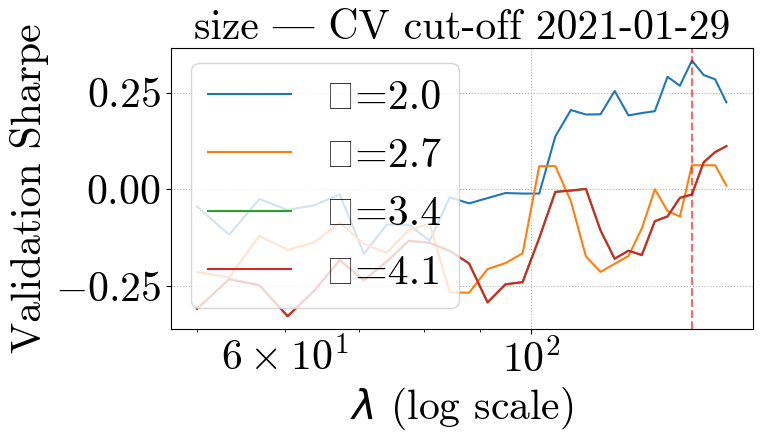

Training data:   2006-01-30 → 2018-01-26, 2955 days  (12.0 years)
Validation data: 2018-01-29 → 2021-01-29, 757 days  (3.0 years)
Best params: λ=50.00, κ=3.42, Sharpe=-0.2839


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


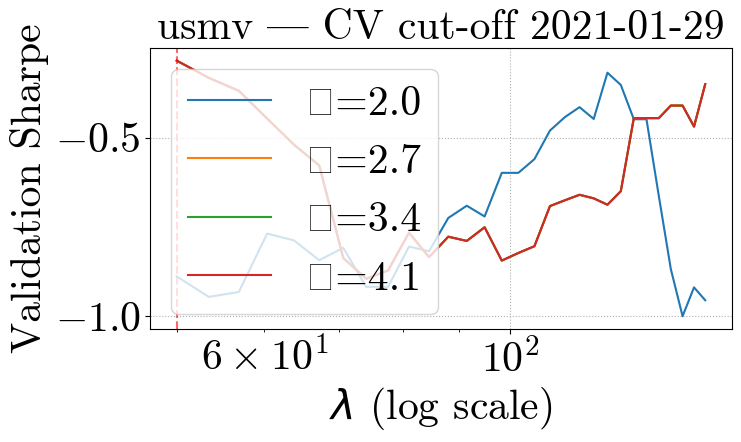

Training data:   2006-01-30 → 2018-01-26, 2955 days  (12.0 years)
Validation data: 2018-01-29 → 2021-01-29, 757 days  (3.0 years)
Best params: λ=129.31, κ=2.71, Sharpe=0.6370


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


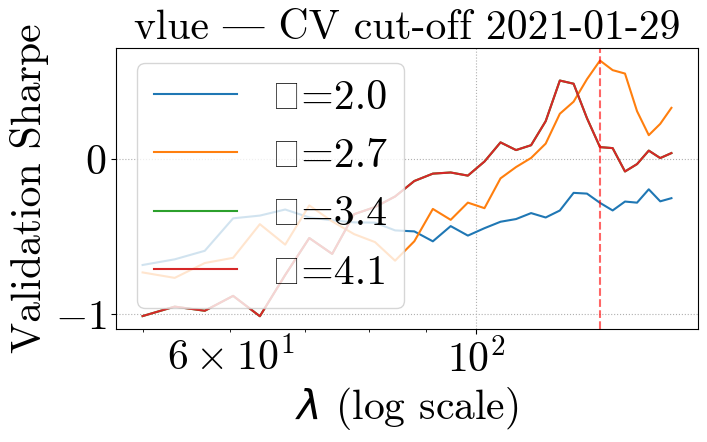

Training data:   2006-07-31 → 2018-07-27, 2959 days  (12.0 years)
Validation data: 2018-07-30 → 2021-07-30, 757 days  (3.0 years)
Best params: λ=136.21, κ=2.00, Sharpe=0.7244


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


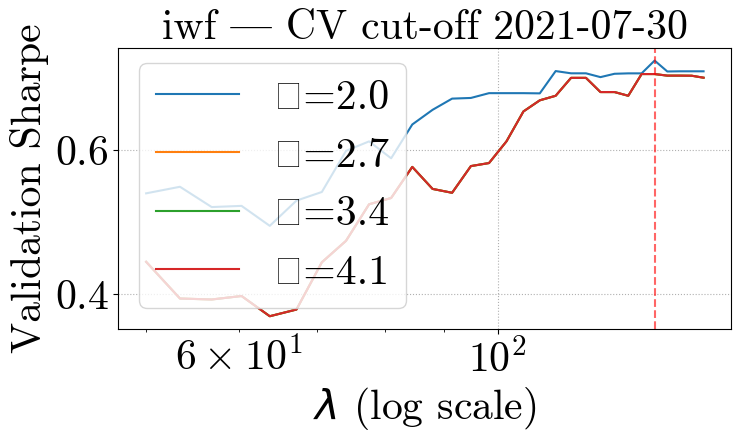

Training data:   2006-07-31 → 2018-07-27, 2959 days  (12.0 years)
Validation data: 2018-07-30 → 2021-07-30, 757 days  (3.0 years)
Best params: λ=74.14, κ=2.00, Sharpe=0.1535


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


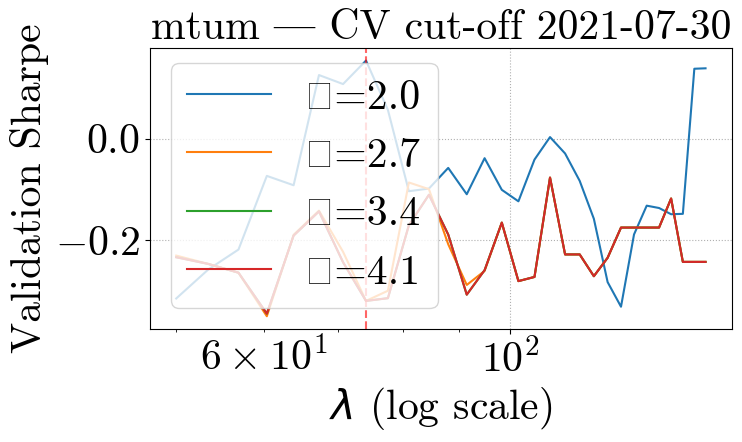

Training data:   2006-07-31 → 2018-07-27, 2959 days  (12.0 years)
Validation data: 2018-07-30 → 2021-07-30, 757 days  (3.0 years)
Best params: λ=63.79, κ=3.42, Sharpe=0.6051


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


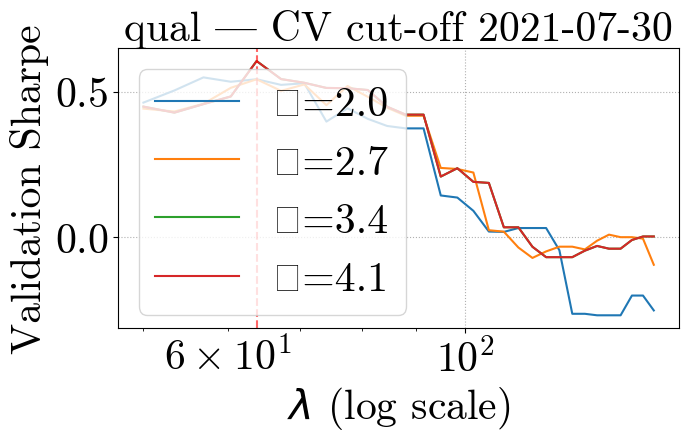

Training data:   2006-07-31 → 2018-07-27, 2959 days  (12.0 years)
Validation data: 2018-07-30 → 2021-07-30, 757 days  (3.0 years)
Best params: λ=143.10, κ=2.00, Sharpe=0.1989


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


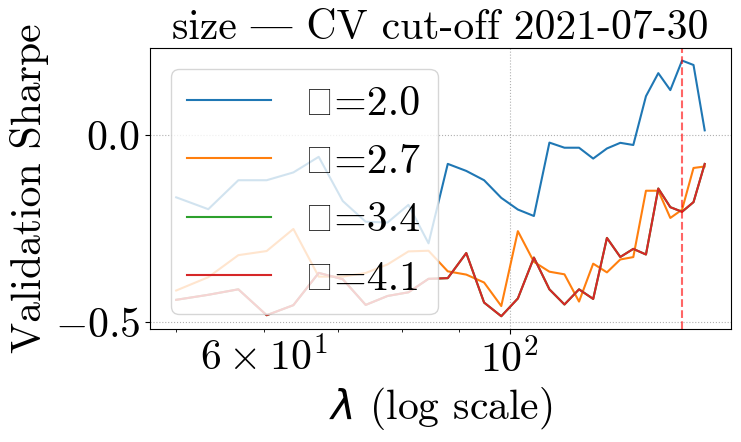

Training data:   2006-07-31 → 2018-07-27, 2959 days  (12.0 years)
Validation data: 2018-07-30 → 2021-07-30, 757 days  (3.0 years)
Best params: λ=50.00, κ=2.71, Sharpe=0.1776


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


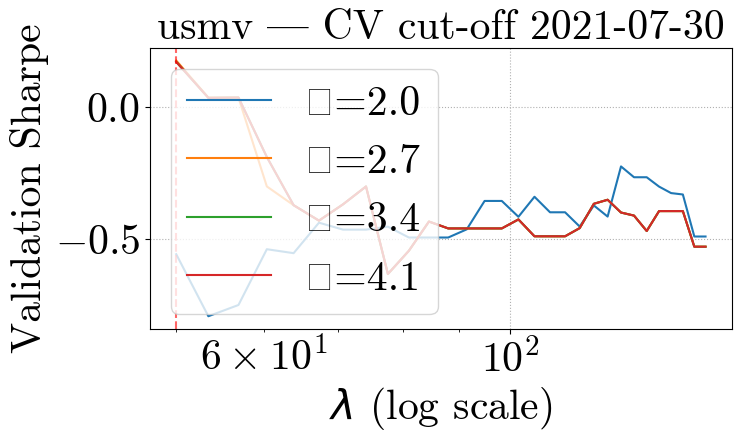

Training data:   2006-07-31 → 2018-07-27, 2959 days  (12.0 years)
Validation data: 2018-07-30 → 2021-07-30, 757 days  (3.0 years)
Best params: λ=136.21, κ=3.42, Sharpe=0.5784


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


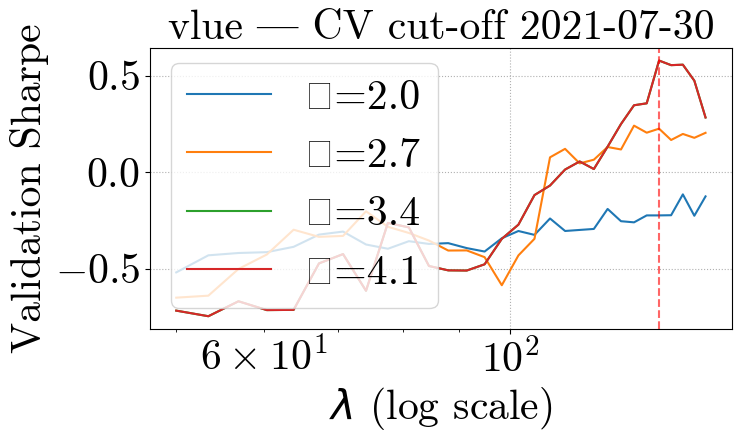

Training data:   2007-01-30 → 2019-01-30, 2966 days  (12.0 years)
Validation data: 2019-01-31 → 2022-01-31, 757 days  (3.0 years)
Best params: λ=143.10, κ=2.00, Sharpe=0.6813


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


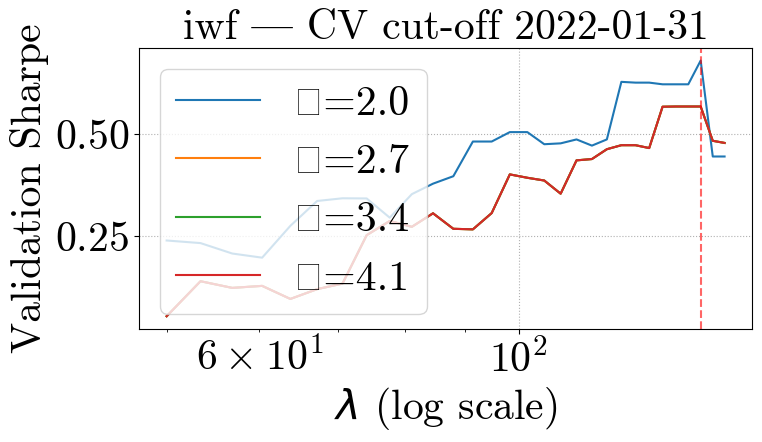

Training data:   2007-01-30 → 2019-01-30, 2966 days  (12.0 years)
Validation data: 2019-01-31 → 2022-01-31, 757 days  (3.0 years)
Best params: λ=60.34, κ=2.71, Sharpe=0.0075


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


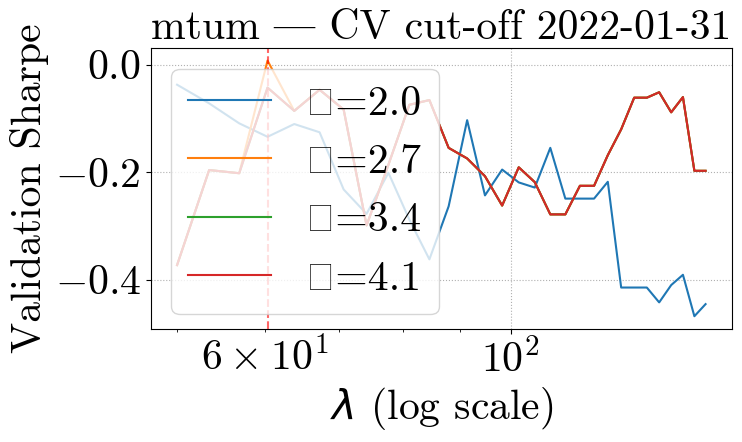

Training data:   2007-01-30 → 2019-01-30, 2966 days  (12.0 years)
Validation data: 2019-01-31 → 2022-01-31, 757 days  (3.0 years)
Best params: λ=60.34, κ=3.42, Sharpe=0.7771


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


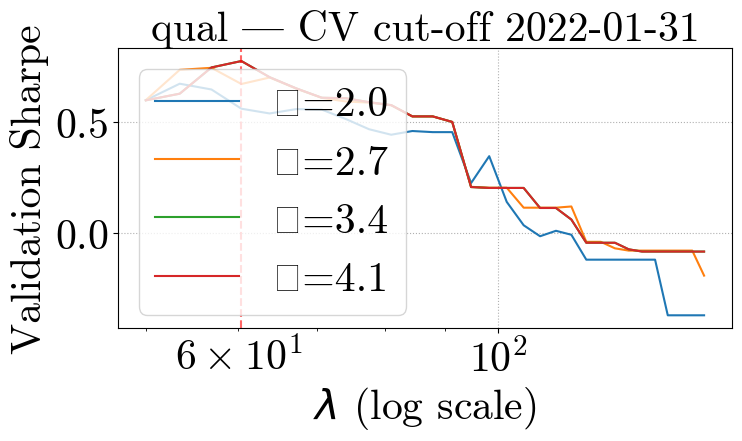

Training data:   2007-01-30 → 2019-01-30, 2966 days  (12.0 years)
Validation data: 2019-01-31 → 2022-01-31, 757 days  (3.0 years)
Best params: λ=143.10, κ=2.00, Sharpe=0.1289


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


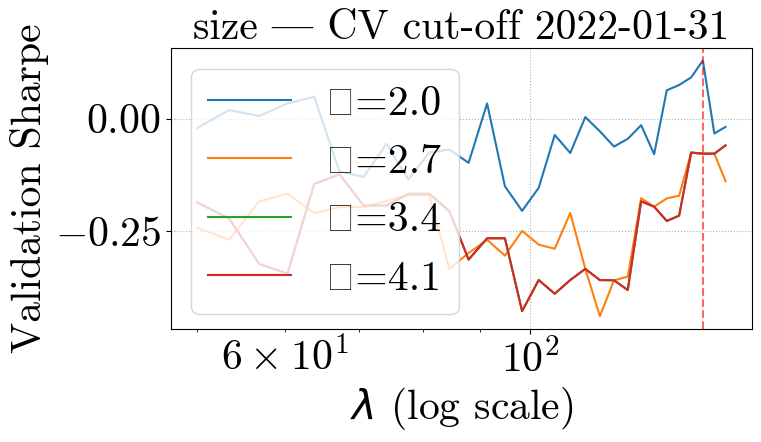

Training data:   2007-01-30 → 2019-01-30, 2966 days  (12.0 years)
Validation data: 2019-01-31 → 2022-01-31, 757 days  (3.0 years)
Best params: λ=50.00, κ=3.42, Sharpe=-0.2677


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


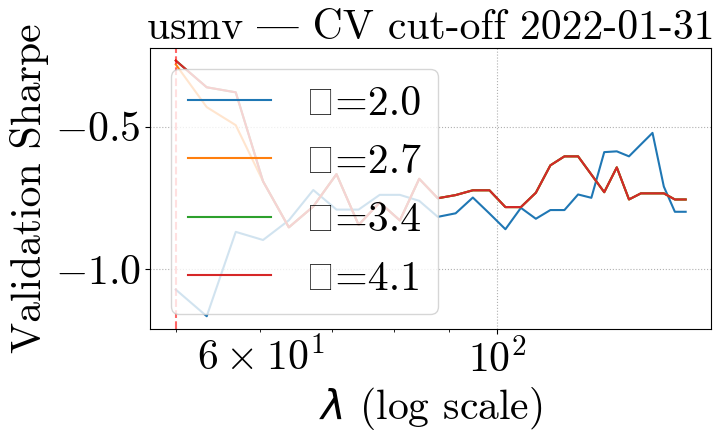

Training data:   2007-01-30 → 2019-01-30, 2966 days  (12.0 years)
Validation data: 2019-01-31 → 2022-01-31, 757 days  (3.0 years)
Best params: λ=143.10, κ=3.42, Sharpe=0.3196


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


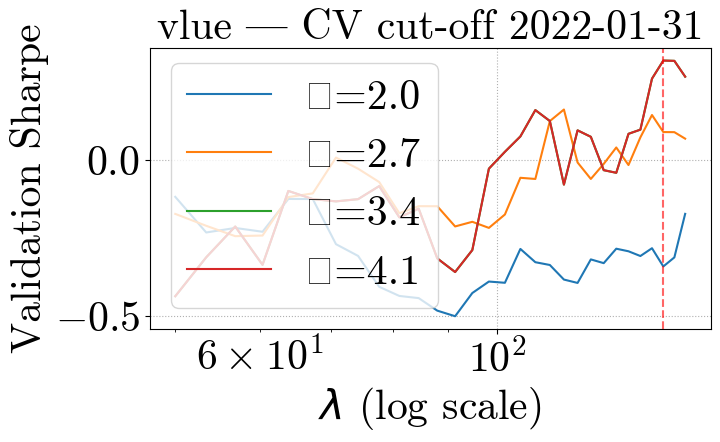

Training data:   2007-07-30 → 2019-07-26, 2968 days  (12.0 years)
Validation data: 2019-07-29 → 2022-07-29, 758 days  (3.0 years)
Best params: λ=98.28, κ=2.00, Sharpe=0.2989


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


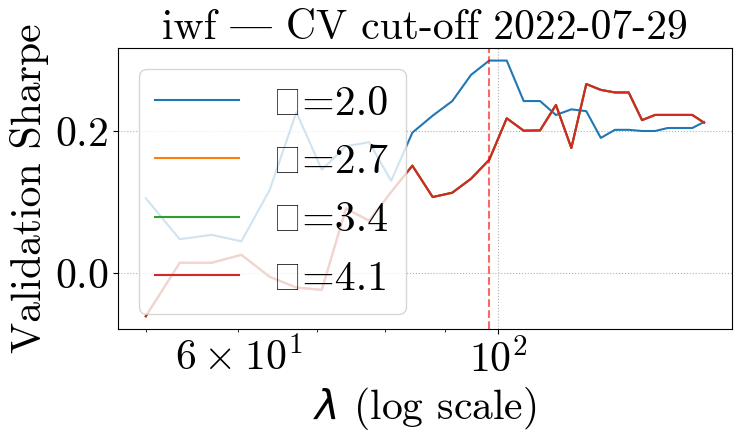

Training data:   2007-07-30 → 2019-07-26, 2968 days  (12.0 years)
Validation data: 2019-07-29 → 2022-07-29, 758 days  (3.0 years)
Best params: λ=67.24, κ=2.00, Sharpe=-0.0407


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


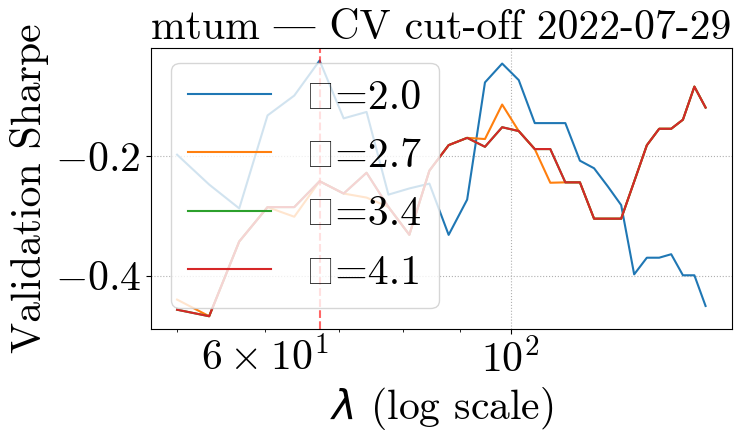

Training data:   2007-07-30 → 2019-07-26, 2968 days  (12.0 years)
Validation data: 2019-07-29 → 2022-07-29, 758 days  (3.0 years)
Best params: λ=56.90, κ=3.42, Sharpe=0.3770


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


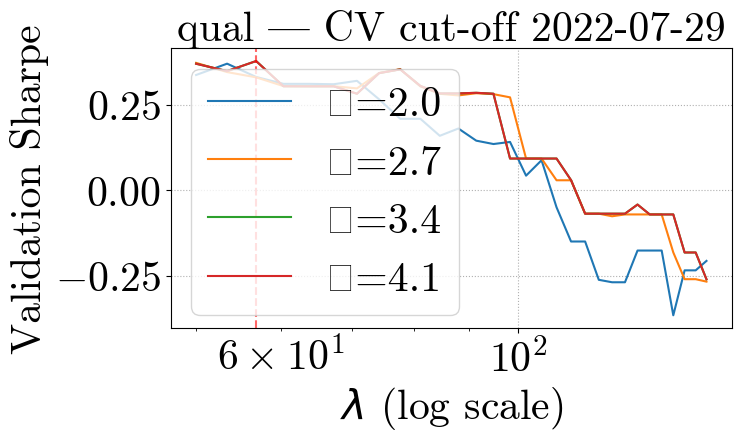

Training data:   2007-07-30 → 2019-07-26, 2968 days  (12.0 years)
Validation data: 2019-07-29 → 2022-07-29, 758 days  (3.0 years)
Best params: λ=143.10, κ=2.00, Sharpe=0.3780


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


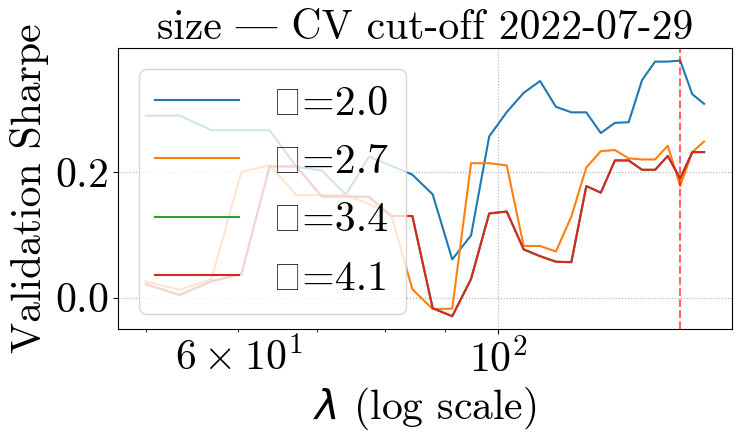

Training data:   2007-07-30 → 2019-07-26, 2968 days  (12.0 years)
Validation data: 2019-07-29 → 2022-07-29, 758 days  (3.0 years)
Best params: λ=60.34, κ=3.42, Sharpe=0.0202


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


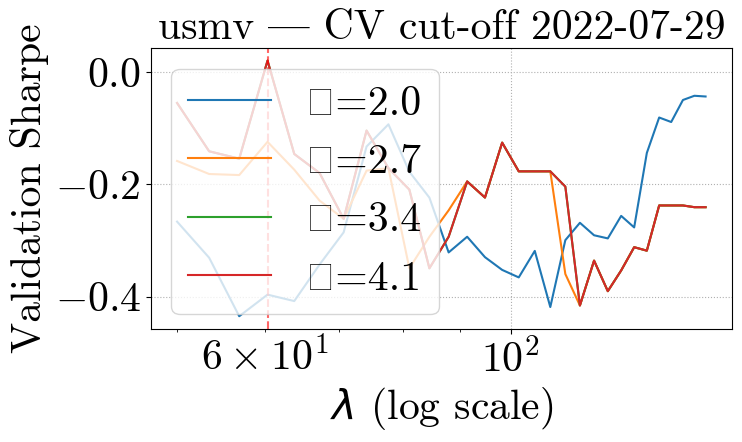

Training data:   2007-07-30 → 2019-07-26, 2968 days  (12.0 years)
Validation data: 2019-07-29 → 2022-07-29, 758 days  (3.0 years)
Best params: λ=129.31, κ=3.42, Sharpe=0.6876


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


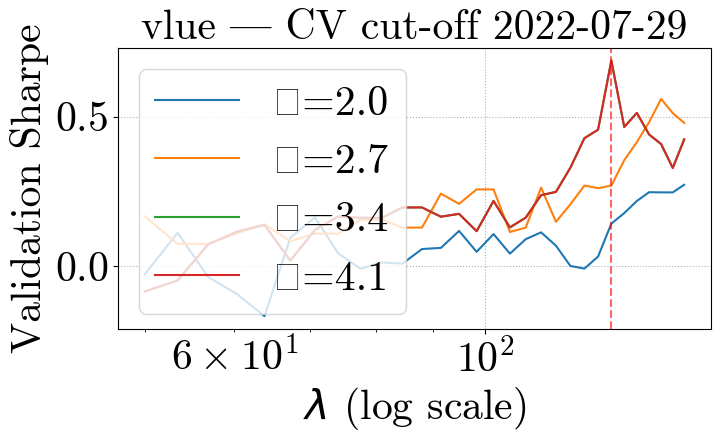

Training data:   2008-01-30 → 2020-01-30, 2975 days  (12.0 years)
Validation data: 2020-01-31 → 2023-01-31, 756 days  (3.0 years)
Best params: λ=125.86, κ=2.71, Sharpe=0.1308


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


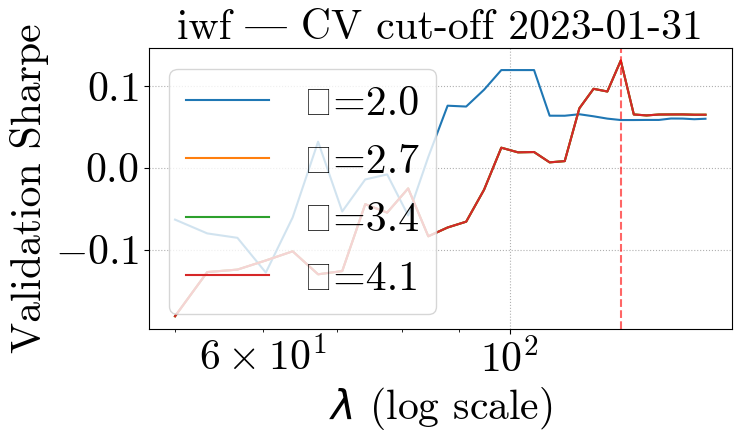

Training data:   2008-01-30 → 2020-01-30, 2975 days  (12.0 years)
Validation data: 2020-01-31 → 2023-01-31, 756 days  (3.0 years)
Best params: λ=60.34, κ=2.71, Sharpe=-0.3224


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


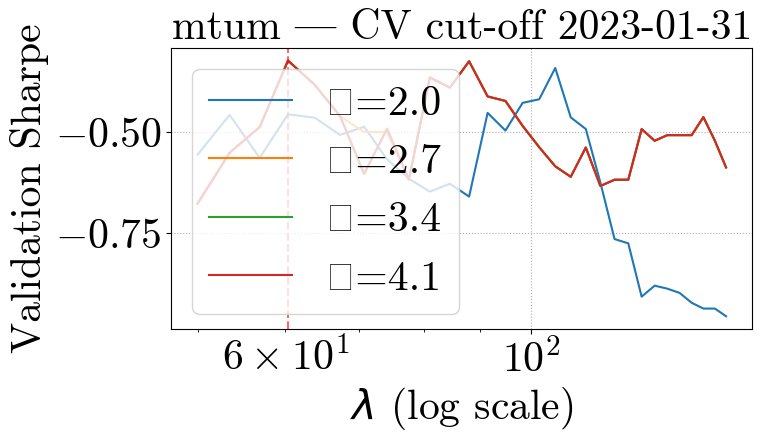

Training data:   2008-01-30 → 2020-01-30, 2975 days  (12.0 years)
Validation data: 2020-01-31 → 2023-01-31, 756 days  (3.0 years)
Best params: λ=94.83, κ=2.71, Sharpe=0.4673


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


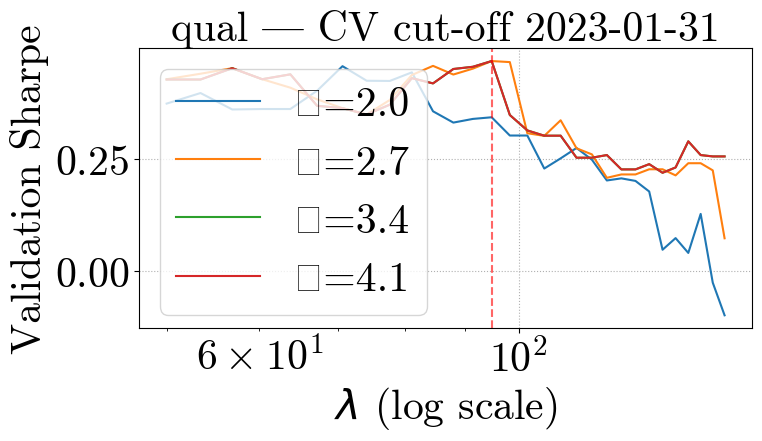

Training data:   2008-01-30 → 2020-01-30, 2975 days  (12.0 years)
Validation data: 2020-01-31 → 2023-01-31, 756 days  (3.0 years)
Best params: λ=105.17, κ=2.00, Sharpe=0.4015


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


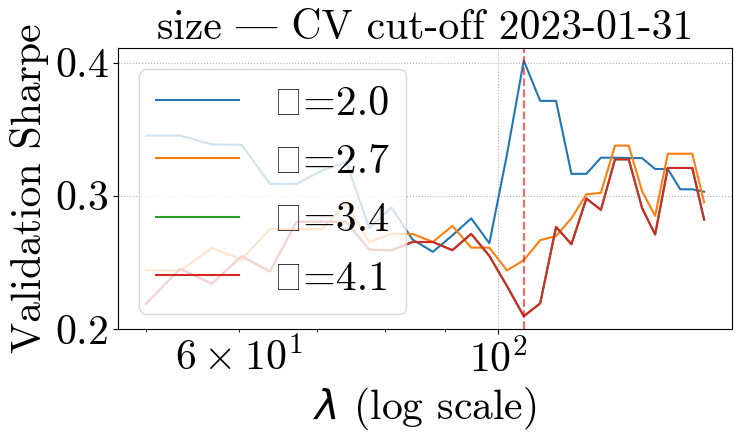

Training data:   2008-01-30 → 2020-01-30, 2975 days  (12.0 years)
Validation data: 2020-01-31 → 2023-01-31, 756 days  (3.0 years)
Best params: λ=146.55, κ=2.00, Sharpe=0.2005


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


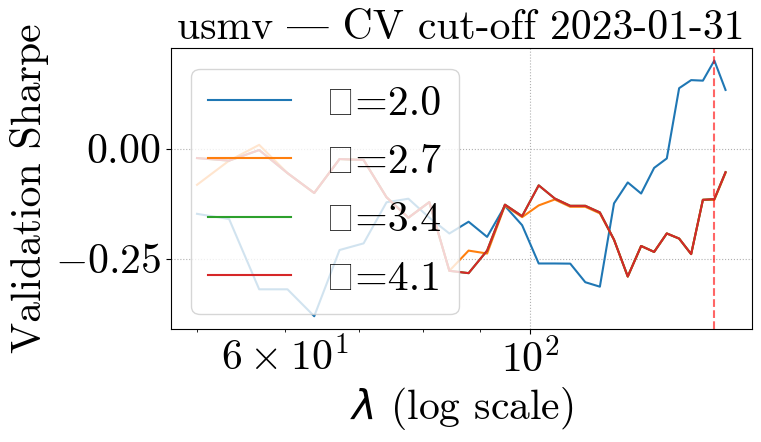

Training data:   2008-01-30 → 2020-01-30, 2975 days  (12.0 years)
Validation data: 2020-01-31 → 2023-01-31, 756 days  (3.0 years)
Best params: λ=150.00, κ=3.42, Sharpe=0.6432


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


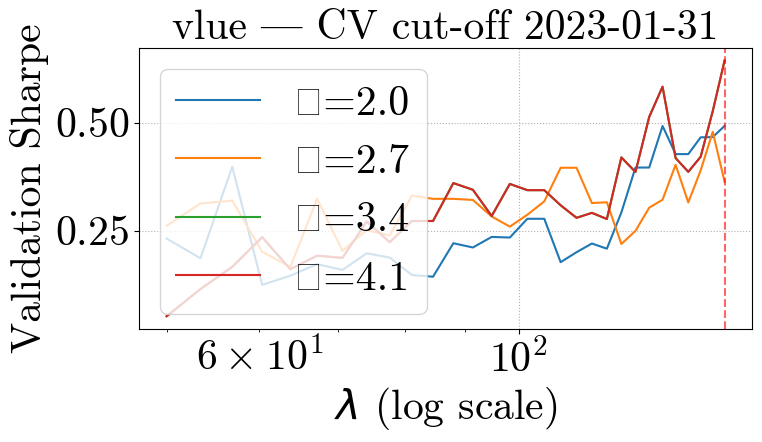

Training data:   2008-07-30 → 2020-07-30, 2979 days  (12.0 years)
Validation data: 2020-07-31 → 2023-07-31, 754 days  (3.0 years)
Best params: λ=74.14, κ=2.00, Sharpe=-0.0177


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


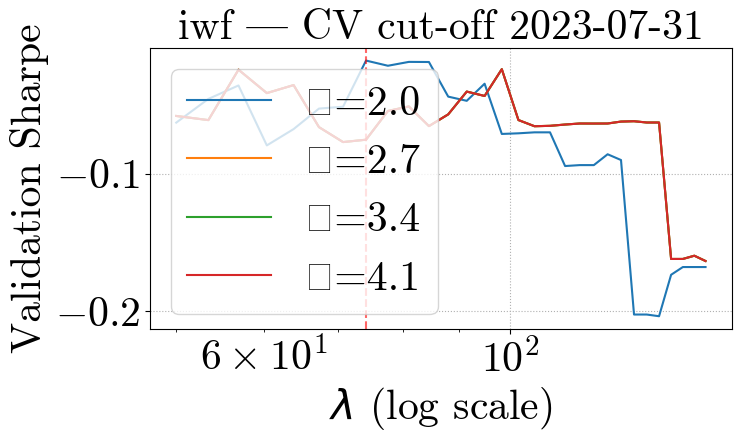

Training data:   2008-07-30 → 2020-07-30, 2979 days  (12.0 years)
Validation data: 2020-07-31 → 2023-07-31, 754 days  (3.0 years)
Best params: λ=108.62, κ=2.71, Sharpe=-0.6621


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


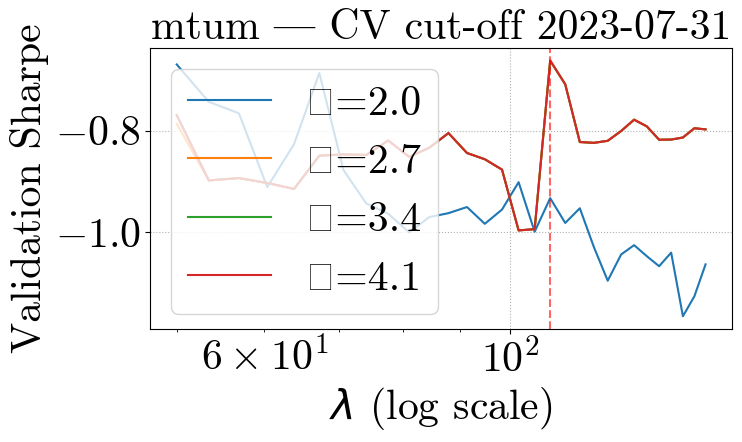

Training data:   2008-07-30 → 2020-07-30, 2979 days  (12.0 years)
Validation data: 2020-07-31 → 2023-07-31, 754 days  (3.0 years)
Best params: λ=81.03, κ=2.00, Sharpe=0.4229


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


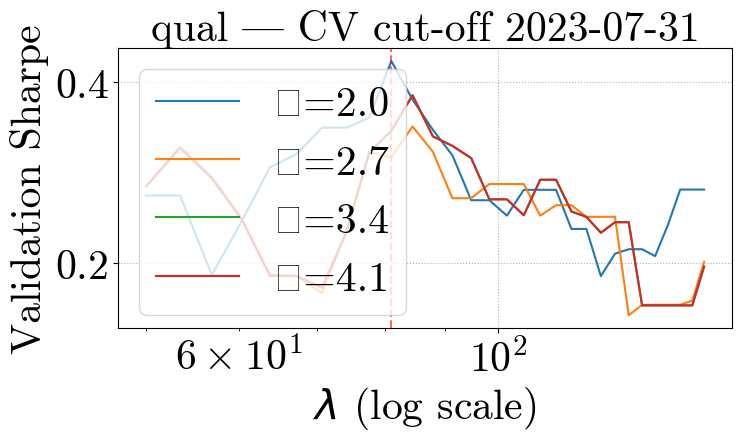

Training data:   2008-07-30 → 2020-07-30, 2979 days  (12.0 years)
Validation data: 2020-07-31 → 2023-07-31, 754 days  (3.0 years)
Best params: λ=74.14, κ=2.00, Sharpe=0.2559


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


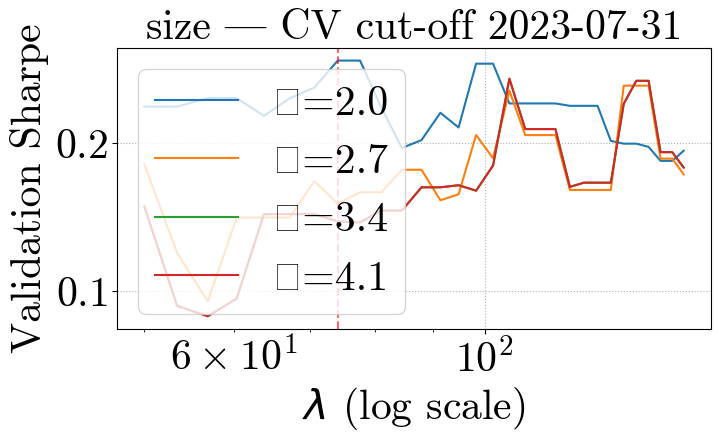

Training data:   2008-07-30 → 2020-07-30, 2979 days  (12.0 years)
Validation data: 2020-07-31 → 2023-07-31, 754 days  (3.0 years)
Best params: λ=132.76, κ=2.00, Sharpe=1.0662


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


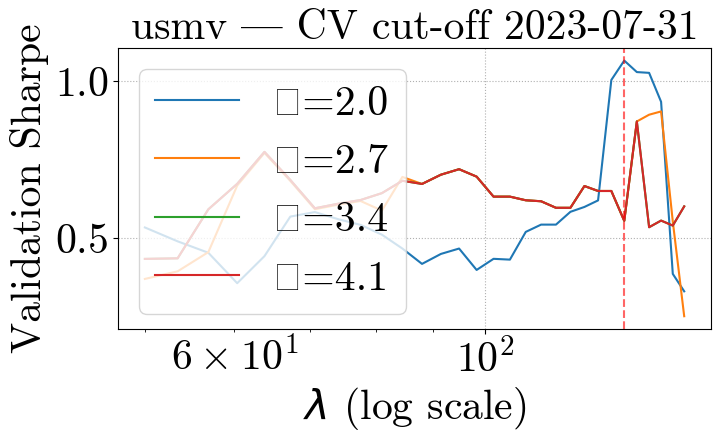

Training data:   2008-07-30 → 2020-07-30, 2979 days  (12.0 years)
Validation data: 2020-07-31 → 2023-07-31, 754 days  (3.0 years)
Best params: λ=53.45, κ=2.71, Sharpe=0.8645


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


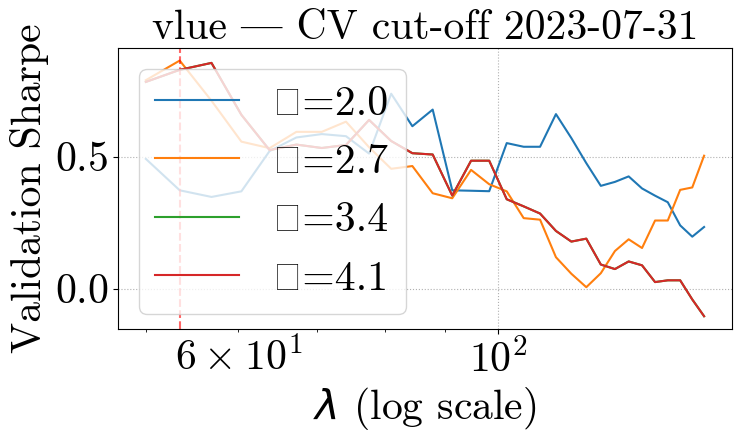

Training data:   2009-01-30 → 2021-01-29, 2983 days  (12.0 years)
Validation data: 2021-02-01 → 2024-01-31, 755 days  (3.0 years)
Best params: λ=50.00, κ=2.00, Sharpe=0.1984


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


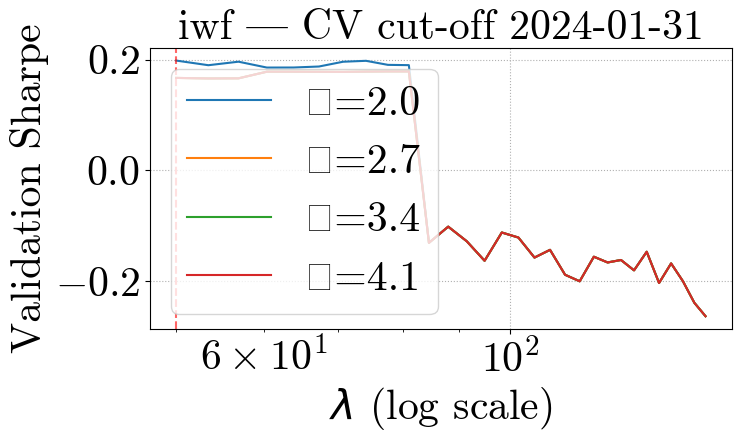

Training data:   2009-01-30 → 2021-01-29, 2983 days  (12.0 years)
Validation data: 2021-02-01 → 2024-01-31, 755 days  (3.0 years)
Best params: λ=81.03, κ=2.00, Sharpe=-0.4199


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


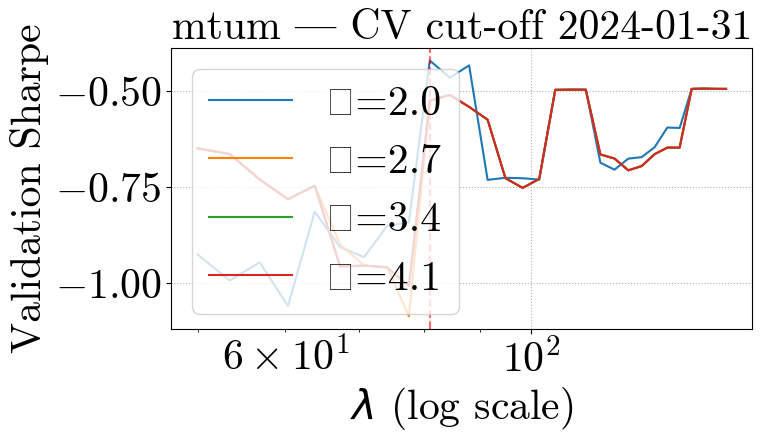

Training data:   2009-01-30 → 2021-01-29, 2983 days  (12.0 years)
Validation data: 2021-02-01 → 2024-01-31, 755 days  (3.0 years)
Best params: λ=50.00, κ=3.42, Sharpe=0.5489


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


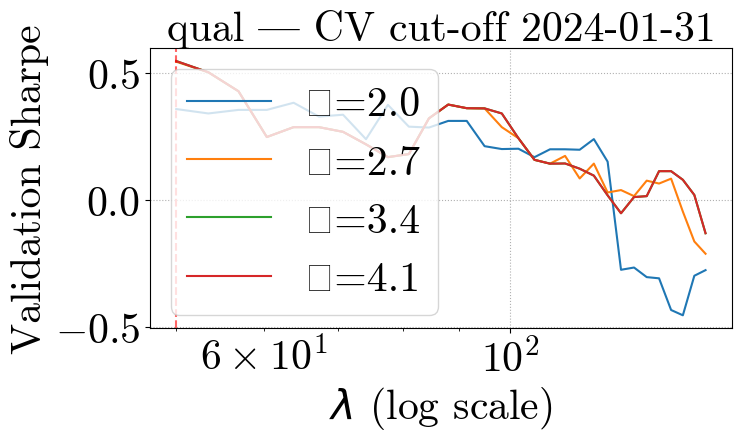

Training data:   2009-01-30 → 2021-01-29, 2983 days  (12.0 years)
Validation data: 2021-02-01 → 2024-01-31, 755 days  (3.0 years)
Best params: λ=125.86, κ=2.00, Sharpe=0.3199


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


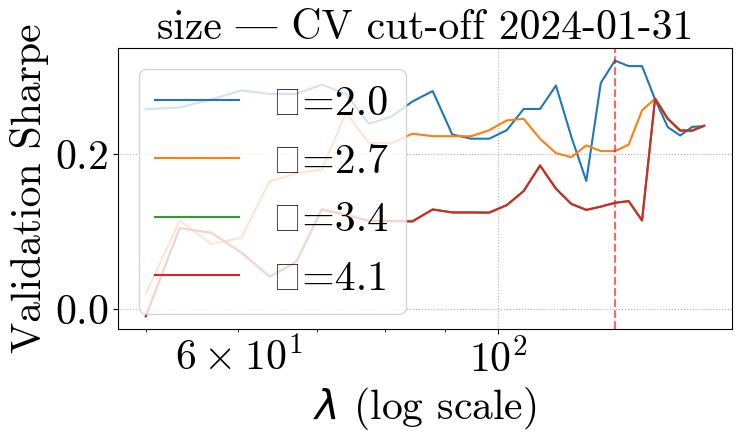

Training data:   2009-01-30 → 2021-01-29, 2983 days  (12.0 years)
Validation data: 2021-02-01 → 2024-01-31, 755 days  (3.0 years)
Best params: λ=139.66, κ=2.00, Sharpe=0.8114


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


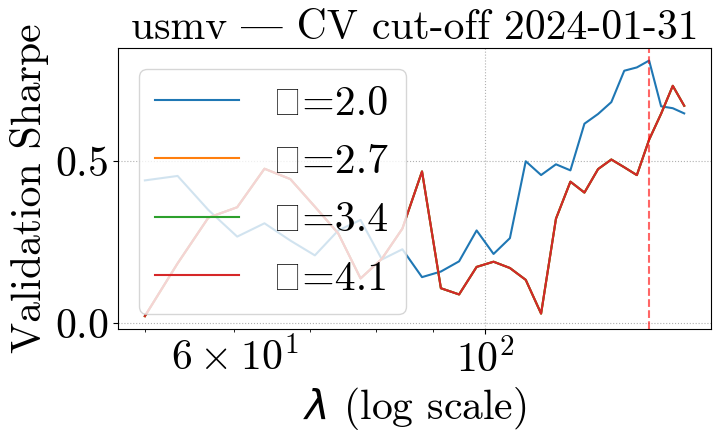

Training data:   2009-01-30 → 2021-01-29, 2983 days  (12.0 years)
Validation data: 2021-02-01 → 2024-01-31, 755 days  (3.0 years)
Best params: λ=56.90, κ=3.42, Sharpe=0.9196


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


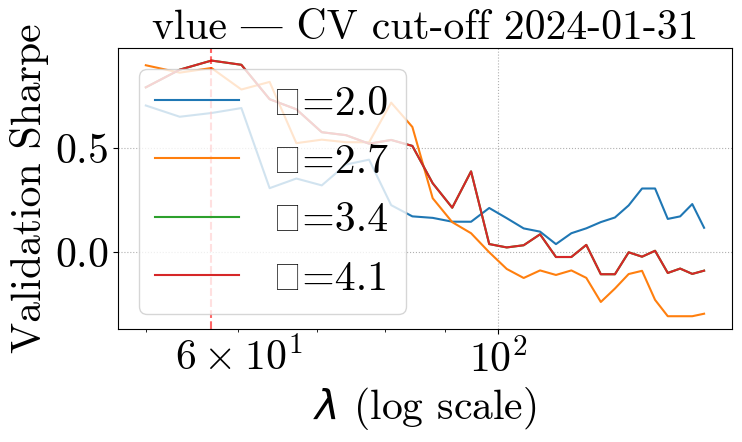

Training data:   2009-07-30 → 2021-07-30, 2988 days  (12.0 years)
Validation data: 2021-08-02 → 2024-07-31, 755 days  (3.0 years)
Best params: λ=60.34, κ=2.71, Sharpe=0.2772


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


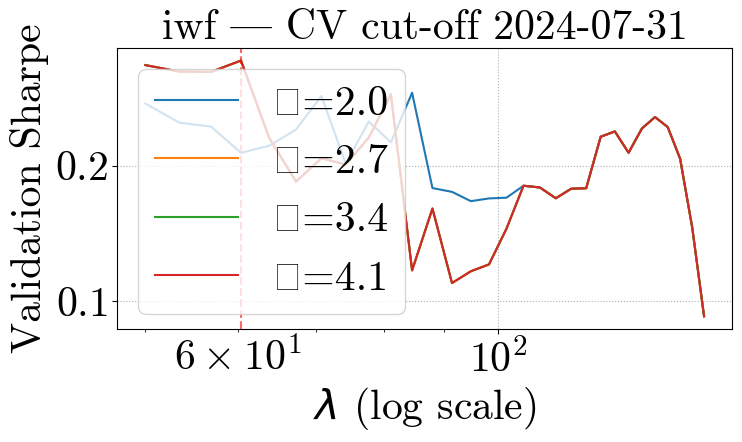

Training data:   2009-07-30 → 2021-07-30, 2988 days  (12.0 years)
Validation data: 2021-08-02 → 2024-07-31, 755 days  (3.0 years)
Best params: λ=53.45, κ=2.71, Sharpe=0.3705


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


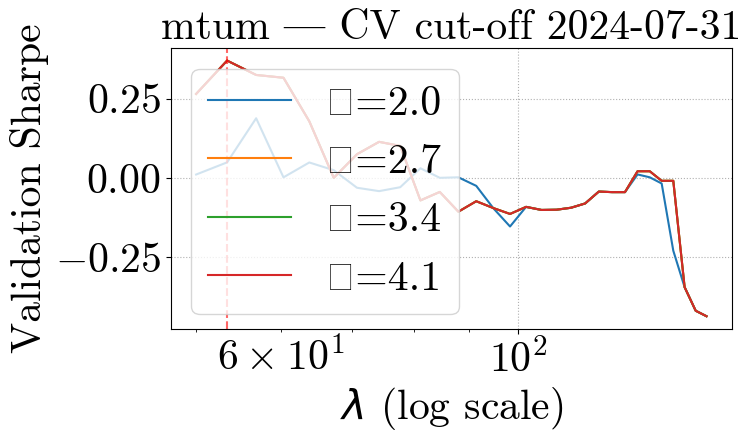

Training data:   2009-07-30 → 2021-07-30, 2988 days  (12.0 years)
Validation data: 2021-08-02 → 2024-07-31, 755 days  (3.0 years)
Best params: λ=50.00, κ=2.71, Sharpe=0.8276


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


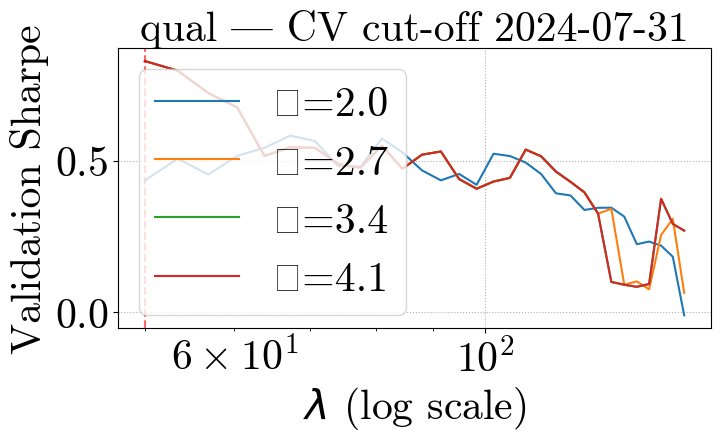

Training data:   2009-07-30 → 2021-07-30, 2988 days  (12.0 years)
Validation data: 2021-08-02 → 2024-07-31, 755 days  (3.0 years)
Best params: λ=122.41, κ=2.00, Sharpe=0.5091


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


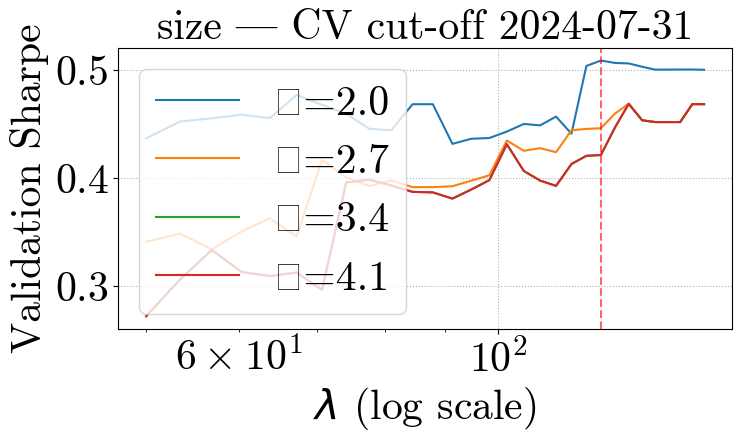

Training data:   2009-07-30 → 2021-07-30, 2988 days  (12.0 years)
Validation data: 2021-08-02 → 2024-07-31, 755 days  (3.0 years)
Best params: λ=150.00, κ=2.71, Sharpe=0.7738


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


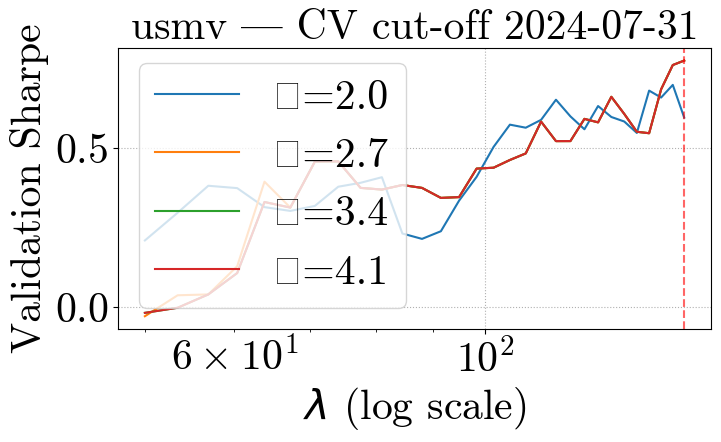

Training data:   2009-07-30 → 2021-07-30, 2988 days  (12.0 years)
Validation data: 2021-08-02 → 2024-07-31, 755 days  (3.0 years)
Best params: λ=50.00, κ=2.00, Sharpe=0.9027


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


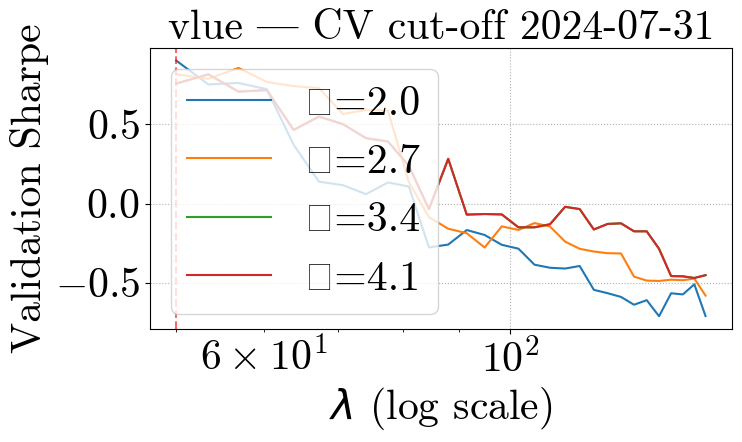

Training data:   2010-02-01 → 2022-01-28, 2992 days  (12.0 years)
Validation data: 2022-01-31 → 2025-01-31, 755 days  (3.0 years)
Best params: λ=84.48, κ=2.00, Sharpe=0.7973


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


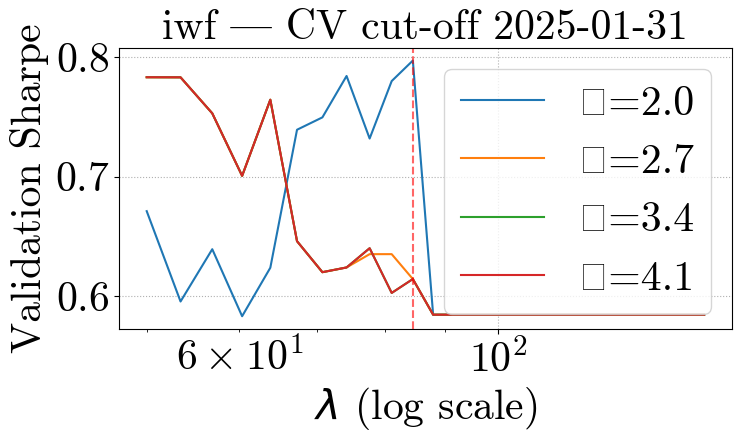

Training data:   2010-02-01 → 2022-01-28, 2992 days  (12.0 years)
Validation data: 2022-01-31 → 2025-01-31, 755 days  (3.0 years)
Best params: λ=63.79, κ=3.42, Sharpe=0.3191


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


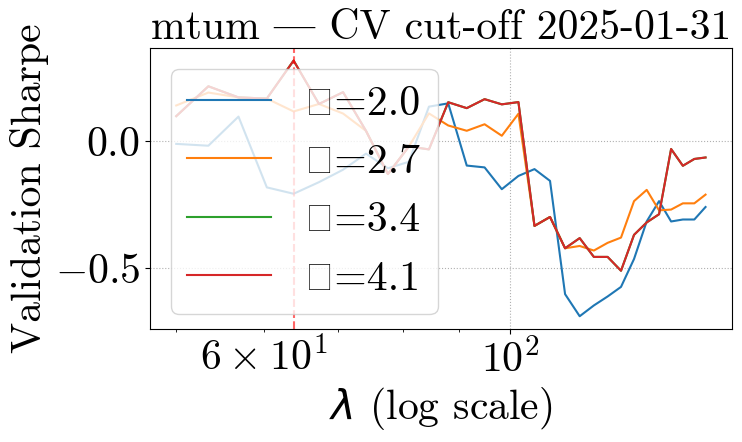

Training data:   2010-02-01 → 2022-01-28, 2992 days  (12.0 years)
Validation data: 2022-01-31 → 2025-01-31, 755 days  (3.0 years)
Best params: λ=50.00, κ=2.71, Sharpe=0.6491


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


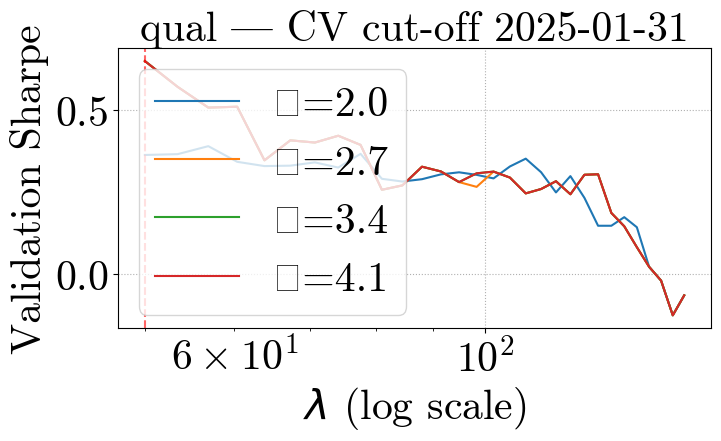

Training data:   2010-02-01 → 2022-01-28, 2992 days  (12.0 years)
Validation data: 2022-01-31 → 2025-01-31, 755 days  (3.0 years)
Best params: λ=146.55, κ=2.00, Sharpe=0.4752


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


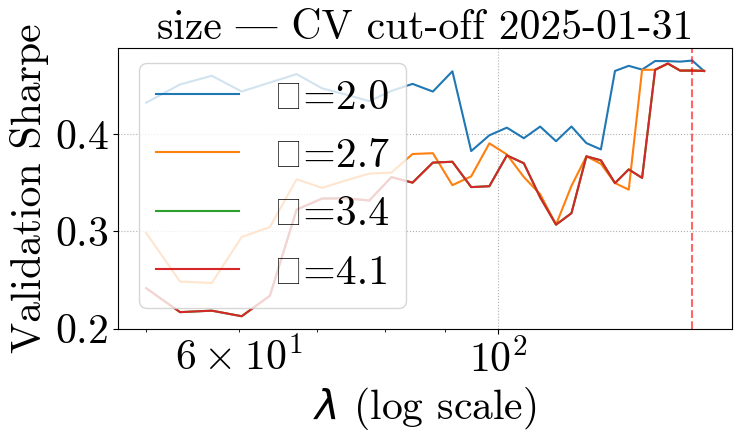

Training data:   2010-02-01 → 2022-01-28, 2992 days  (12.0 years)
Validation data: 2022-01-31 → 2025-01-31, 755 days  (3.0 years)
Best params: λ=105.17, κ=2.71, Sharpe=0.9451


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


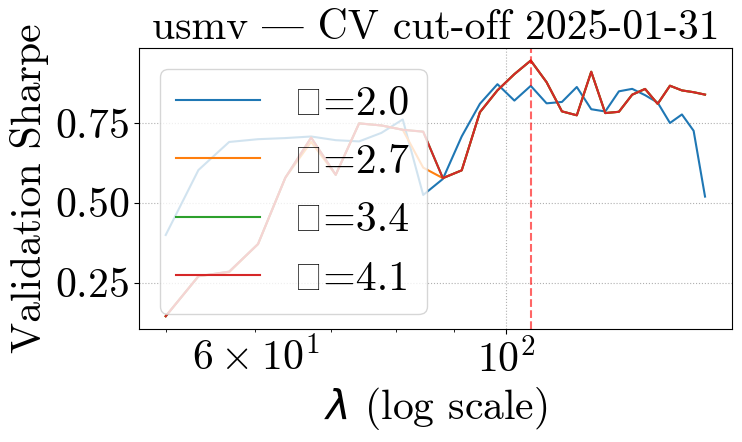

Training data:   2010-02-01 → 2022-01-28, 2992 days  (12.0 years)
Validation data: 2022-01-31 → 2025-01-31, 755 days  (3.0 years)
Best params: λ=53.45, κ=2.00, Sharpe=0.1469


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


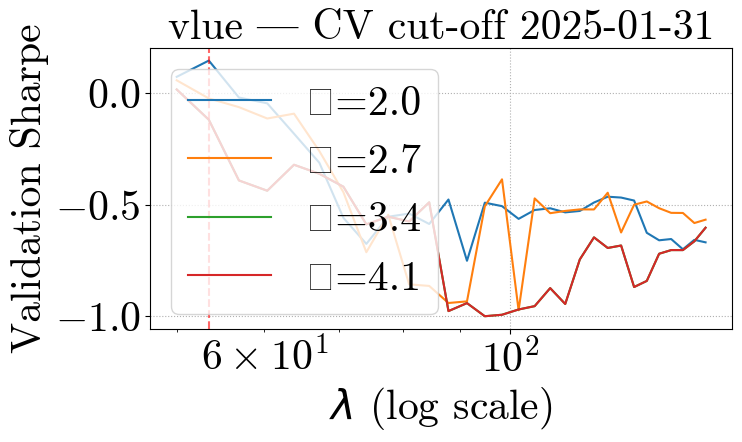

Training data:   2010-04-06 → 2022-04-01, 2994 days  (12.0 years)
Validation data: 2022-04-04 → 2025-04-03, 754 days  (3.0 years)
Best params: λ=60.34, κ=2.00, Sharpe=0.6261


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


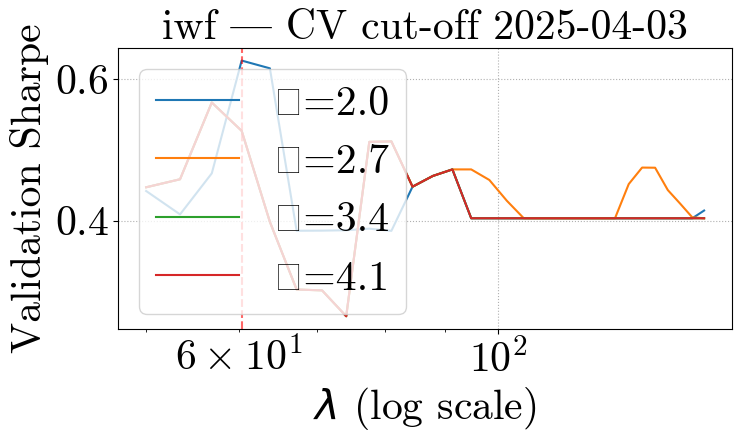

Training data:   2010-04-06 → 2022-04-01, 2994 days  (12.0 years)
Validation data: 2022-04-04 → 2025-04-03, 754 days  (3.0 years)
Best params: λ=56.90, κ=3.42, Sharpe=0.1866


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


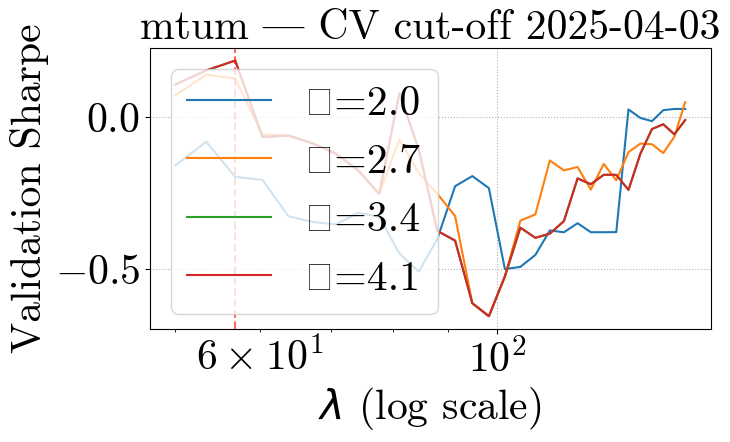

Training data:   2010-04-06 → 2022-04-01, 2994 days  (12.0 years)
Validation data: 2022-04-04 → 2025-04-03, 754 days  (3.0 years)
Best params: λ=50.00, κ=2.71, Sharpe=0.7117


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


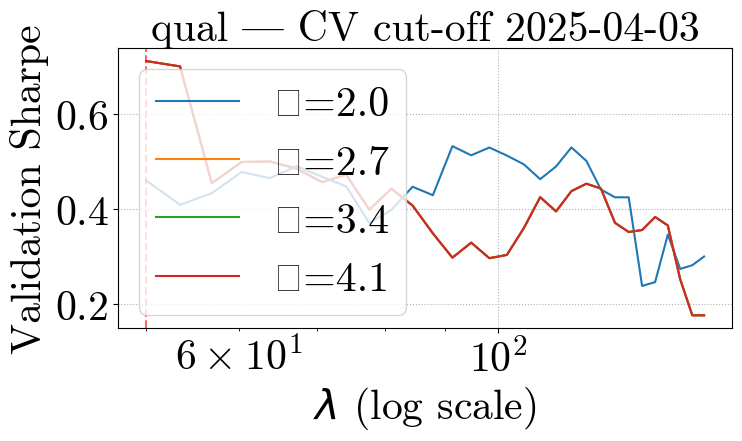

Training data:   2010-04-06 → 2022-04-01, 2994 days  (12.0 years)
Validation data: 2022-04-04 → 2025-04-03, 754 days  (3.0 years)
Best params: λ=115.52, κ=2.00, Sharpe=0.1905


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


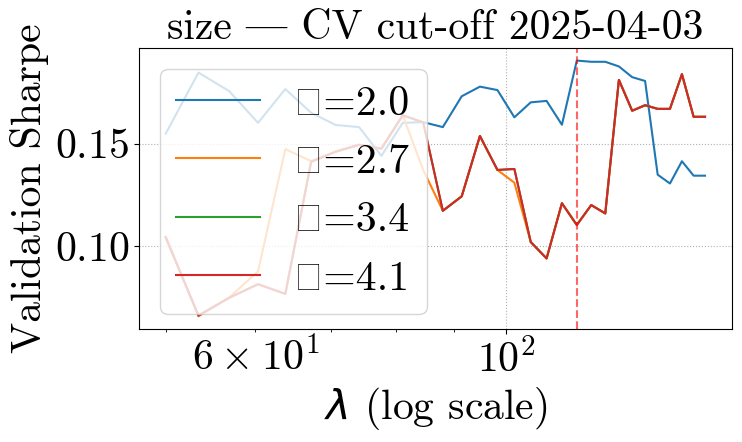

Training data:   2010-04-06 → 2022-04-01, 2994 days  (12.0 years)
Validation data: 2022-04-04 → 2025-04-03, 754 days  (3.0 years)
Best params: λ=139.66, κ=2.71, Sharpe=0.6899


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


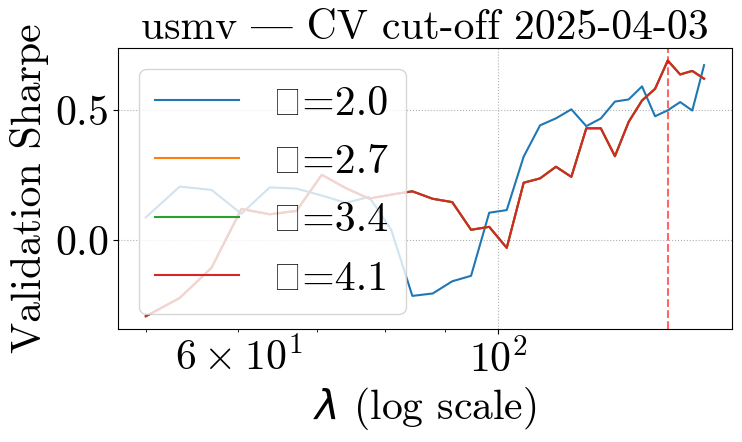

Training data:   2010-04-06 → 2022-04-01, 2994 days  (12.0 years)
Validation data: 2022-04-04 → 2025-04-03, 754 days  (3.0 years)
Best params: λ=53.45, κ=2.00, Sharpe=-0.0065


/var/folders/gk/xfygs6rj3rx52bvtkzjhg66m0000gn/T/ipykernel_83626/3697569087.py:69: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  plt.tight_layout(); plt.show()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 954 (\N{GREEK SMALL LETTER KAPPA}) missing from font(s) cmr10.
  fig.canvas.print_figure(bytes_io, **kw)


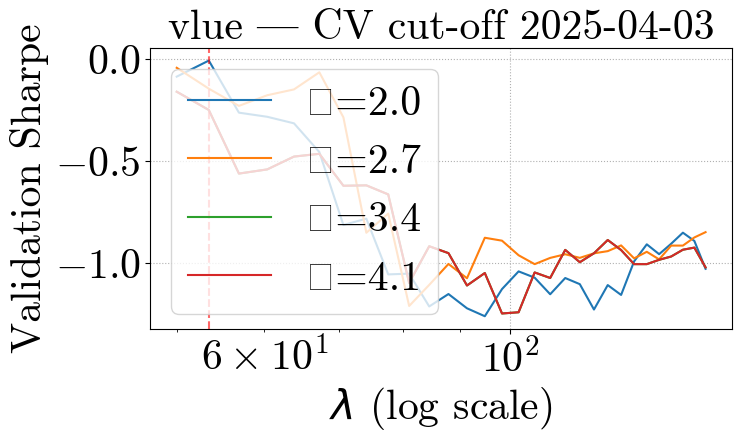

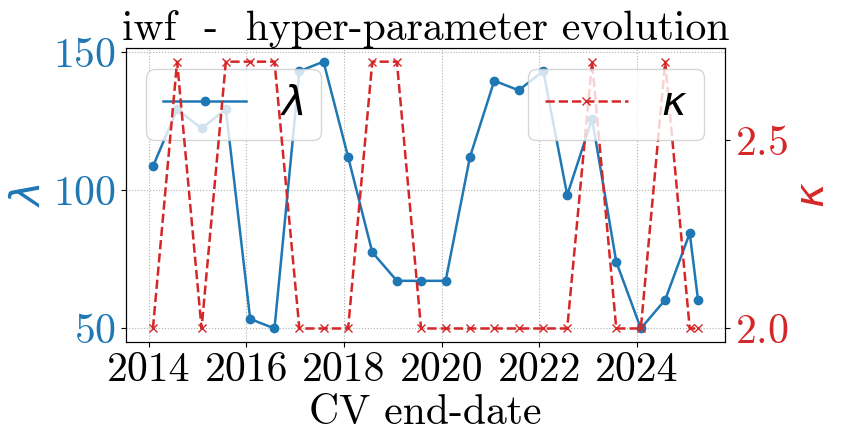

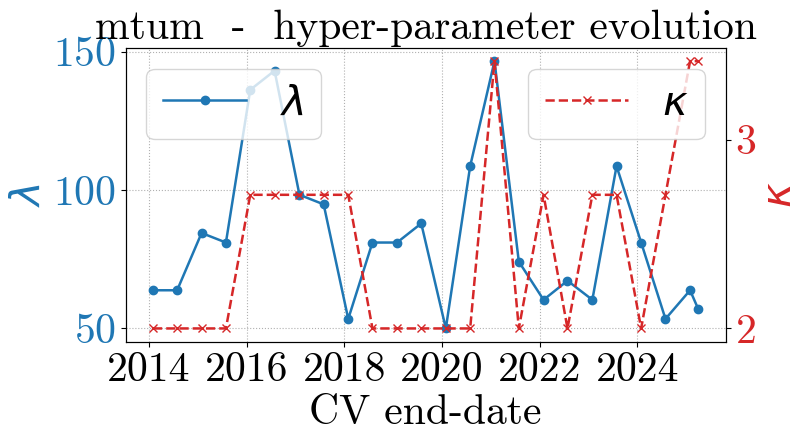

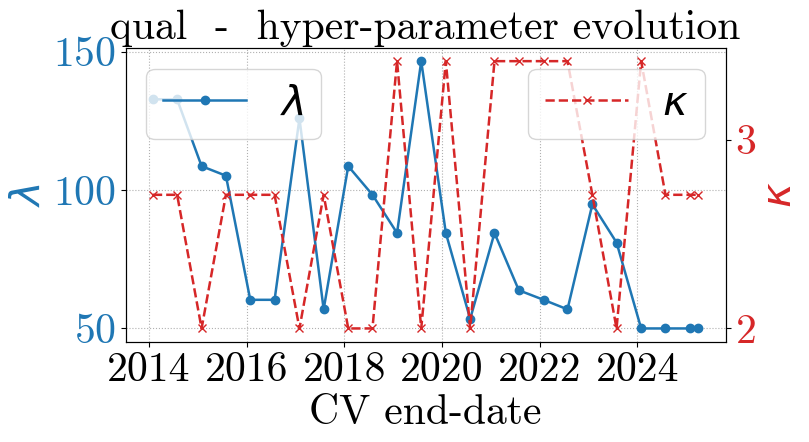

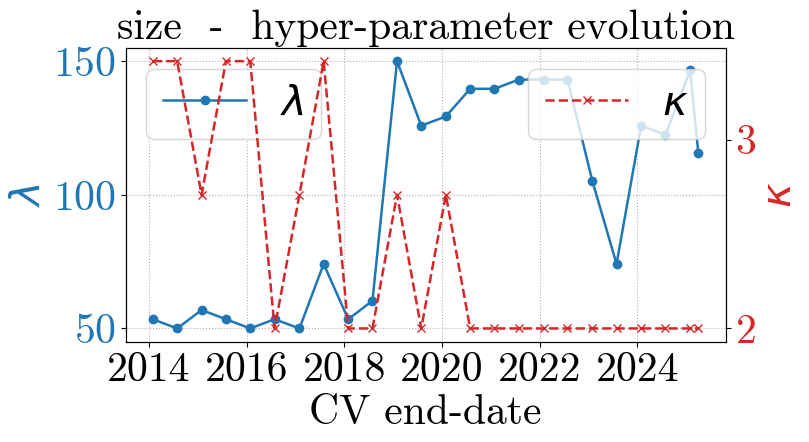

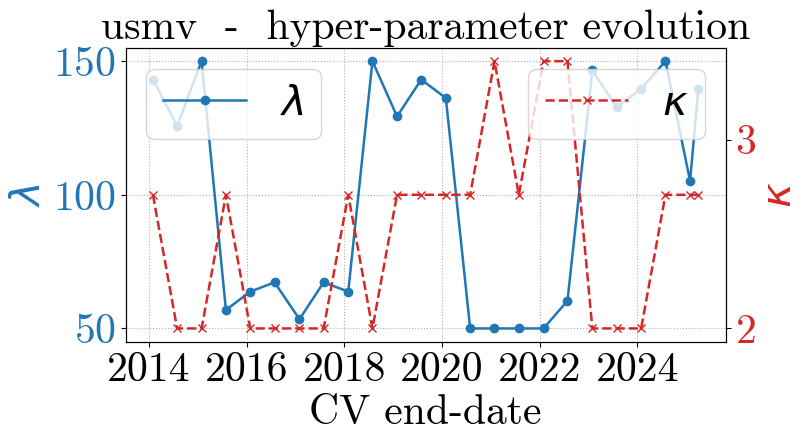

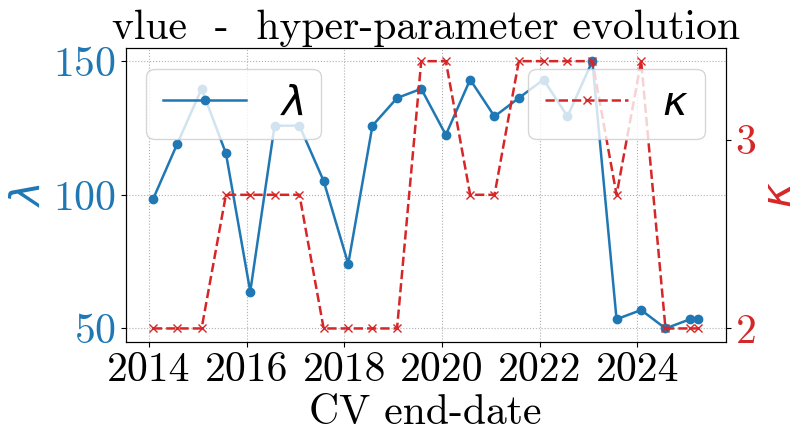

Saved tuned parameters to parquet
         date factor  best_lambda  best_kappa
0  2014-01-31    iwf   108.620690    2.000000
6  2014-07-31    iwf   129.310345    2.707702
12 2015-01-30    iwf   122.413793    2.000000
18 2015-07-31    iwf   129.310345    2.707702
24 2016-01-29    iwf    53.448276    2.707702


In [18]:
# -------------------------  QUICK STAND‑ALONE RUN  ----------------------- #
# ---- user‑specific setup (exactly as in your original script) -------- #

# Paths & tickers -----------------------------------------------------------------------
TEST_START       = "2014-01-01"
RECROSS_VAL_FREQ = "6ME"          # six‑month‑end


script_dir = os.getcwd()
base_dir   = os.path.abspath(os.path.join(script_dir, "..", ".."))
data_dir   = os.path.join(base_dir, "data_new")

factor_file = os.path.join(data_dir, "1estimation_index_returns.csv")
market_file = os.path.join(data_dir, "1macro_data.csv")
etf_file    = os.path.join(data_dir, "2trading_etf_returns_aligned.csv")

factors = ["iwf", "mtum", "qual", "size", "usmv", "vlue"]   

lambda_values = np.linspace(50, 150, 30)
# kappa grid can depend on feature count; a simple fixed grid is fine
kappa_values  = np.linspace(2, np.sqrt(17), 4)

# ------- load full data into factor_data_dict here -------------------- #
# (use your existing MergedDataLoader logic)
factor_data_dict = {}
for fac in factors:
    data = MergedDataLoader(
                factor_file=factor_file,
                market_file=market_file,
                ver="v2",
                factor_col=fac).load()

    common_idx = (data.X.index
                    .intersection(data.ret_ser.index)
                    .intersection(data.market_ser.index))

    factor_data_dict[fac] = {
        "X":       data.X.loc[common_idx],
        "fac_ret": data.ret_ser.loc[common_idx],
        "mkt_ret": data.market_ser.loc[common_idx],
    }


master_index = factor_data_dict[factors[0]]["X"].index.sort_values()
test_index   = master_index[master_index >= TEST_START]

recross_val_boundaries = (
    test_index.to_series()
    .resample(RECROSS_VAL_FREQ)
    .last()
    .dropna()                     # Series of Timestamp objects
)
# ----------------------------------------------------------------------

cv_table = run_cv(factors,
                    factor_data_dict,
                    cv_dates=recross_val_boundaries,
                    lambda_grid=lambda_values,
                    kappa_grid=kappa_values,
                    initial_train_start="2002-05-31")

print("Saved tuned parameters to parquet")
print(cv_table.head())